In [55]:
import pandas as pd
import os
import yaml
import matplotlib.pyplot as plt
import seaborn as sns
import h5py
from scipy.stats import ecdf, ttest_ind, mannwhitneyu
import seaborn as sns
import matplotlib.colors as mcolors

from utils import *

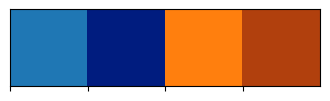

In [56]:
# Get the first two colors from the default Seaborn color palette
base_colors = sns.color_palette("tab10", 2)  # Blue and Orange

# Create the darker versions
darker_colors = sns.color_palette("dark", 2)  # Blue and Orange

# Combine into a single palette
custom_palette = [base_colors[0], darker_colors[0], base_colors[1], darker_colors[1]]

# Optional: set it as the current Seaborn palette
sns.set_palette(custom_palette)

# Preview
import matplotlib.pyplot as plt
sns.palplot(custom_palette)
plt.show()

In [57]:
config = yaml.safe_load(open('/Users/ursic/PhD/Projects/1_DataAnalysis_zebrafish/beads_in_zebrafish/magnetic_tweezers_SD/config_noco.yml'))

filepath_measurements_info = config['filepath_measurements_info']
dir_plots = os.path.join(config['dir_parent'], '3_plots')  # Folder for saving plots
dir_analysis = os.path.join(config['dir_parent'], '2_analysis')  # Folder for saving analysis results
recalculate = config['recalculate']  # Whether to recalculate measurements if they already exist
pix_size = config['pix_size'] 
dt = config['dt']  # Time step in seconds

force_ranges = config['force_ranges']  # Force ranges for averaging curves
force_range = force_ranges[0]

subtract_backgroung = config['subtract_background']  # Whether to subtract background from displacement

creep_only = False
if config['fit_type'] == 'creep jeff':
    creep_only = True  # If the fit type is 'creep jeff', we only plot creep curves
    
creep_only_label = '_only_creep' if creep_only else ''

displacement_column = 'CORRECTED DISPLACEMENT [um]' if subtract_backgroung else 'DISPLACEMENT [um]'  # Use the original displacement, not corrected
subtr_bck_label = 'subtr_bck' if subtract_backgroung else 'no_subtr_bck'

In [58]:
df_results_perturb = pd.read_csv(dir_plots + f'/results/results_material_properties_{subtr_bck_label}.csv')

In [59]:
df_results_perturb = df_results_perturb.sort_values(by='MT_STATUS', ascending=False)

print(df_results_perturb.columns)

Index(['Unnamed: 0', 'file', 'EXPERIMENT', 'EMBRYO', 'TRACK_ID',
       'PULSE_NUMBER', 'MT_STATUS', 'AVG_FORCE', 'k', 'eta_1', 'eta_2',
       'k_err', 'eta_1_err', 'eta_2_err', 'k_KV', 'eta_KV', 'k_KV_err',
       'eta_KV_err', 't_1', 'R_SQUARED', 'R_SQUARED_KV', 'fit_divisible',
       'relax_too_much', 'rising_dif', 'relaxing_dif', 'rising_dif_norm',
       'rising_dif_norm_inverse', 'relative_dif', 'tau_r', 'a',
       'elastic_viscous_ratio'],
      dtype='object')


# General overview

In [60]:
N_tracks = len(df_results_perturb)
N_relaxed_too_much = len(df_results_perturb[df_results_perturb['relax_too_much'] == True])
N_not_differentiable = len(df_results_perturb[df_results_perturb['fit_divisible'] == False])

print(f'We have in total {N_tracks} tracks. ')
print(f'Out of those, we have {N_relaxed_too_much} tracks that relaxed to a value below zero. We do not take those into account.')
print(f'Furthermore, we have {N_not_differentiable} tracks that are not differentiable. We do not take those into account either.\n')

N_R_low = len(df_results_perturb[df_results_perturb['R_SQUARED'] < 0.8])
print(f'Number of fits with R^2 < 0.5: {N_R_low}')

We have in total 407 tracks. 
Out of those, we have 83 tracks that relaxed to a value below zero. We do not take those into account.
Furthermore, we have 11 tracks that are not differentiable. We do not take those into account either.

Number of fits with R^2 < 0.5: 176


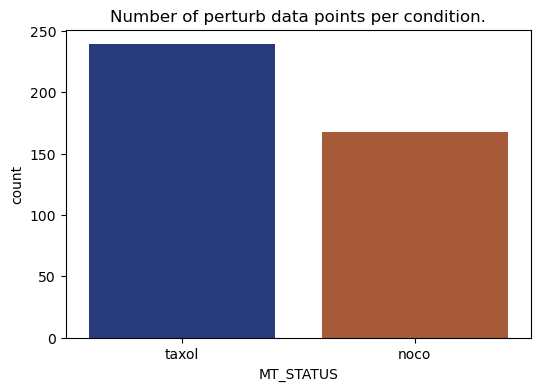

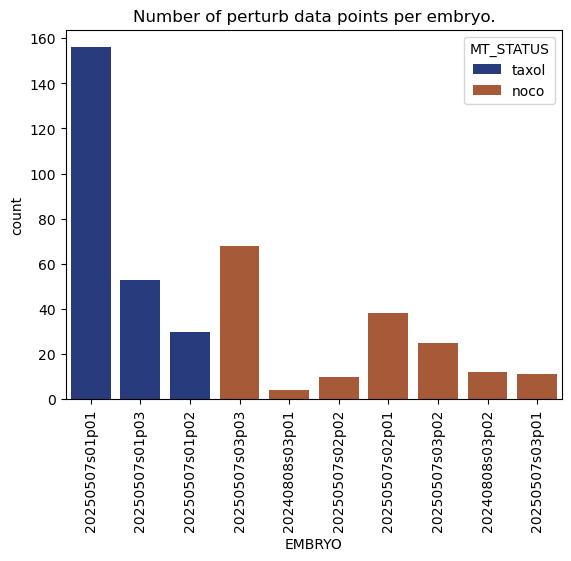

In [61]:
fig = plt.figure(figsize=(6, 4))
# Second subplot: Summary statistics

sns.countplot(data=df_results_perturb, x='MT_STATUS', hue='MT_STATUS', alpha=0.9, palette=darker_colors)
plt.title(f'Number of perturb data points per condition.')
plt.show()

sns.countplot(data=df_results_perturb, x='EMBRYO', hue='MT_STATUS', alpha=0.9, palette=darker_colors)
plt.title(f'Number of perturb data points per embryo.')
plt.xticks(rotation=90)
plt.show()

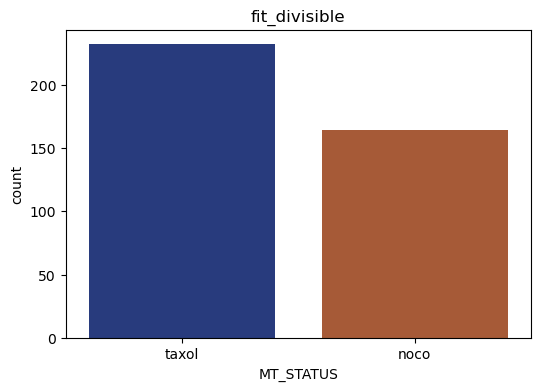

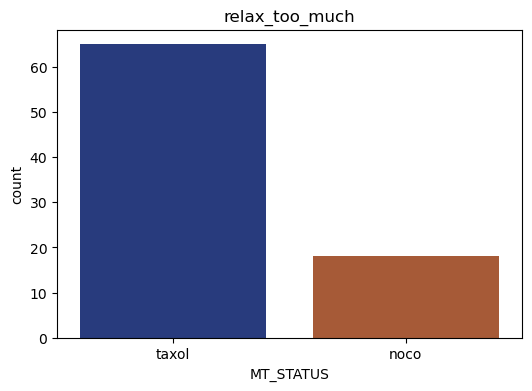

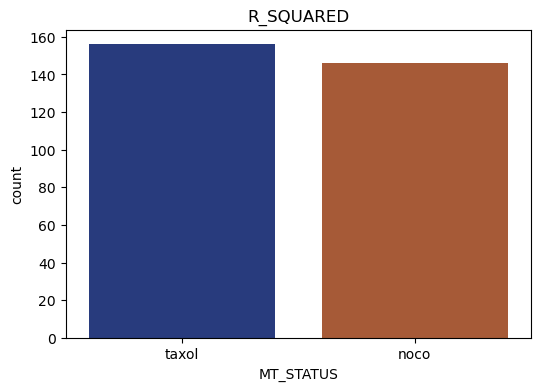

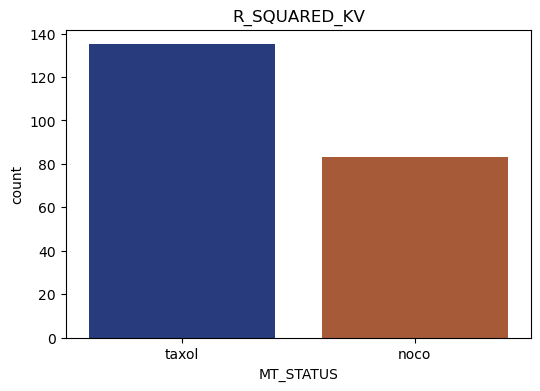

In [62]:
comparissons = ['fit_divisible', 'relax_too_much', 'R_SQUARED', 'R_SQUARED_KV']

boxprops = dict(linestyle='-', linewidth=1, color='gray', fill=False)
for comp in comparissons:
    fig = plt.figure(figsize=(6, 4))
    # Second subplot: Summary statistics
    sns.countplot(data=df_results_perturb[df_results_perturb[comp]>0.5], x='MT_STATUS', hue='MT_STATUS', alpha=0.9, palette=darker_colors)
    plt.title(f'{comp}')

In [63]:
r_sq_min = 0.5
print(f'Number of successful fits with Jeffreys model: ',  sum(df_results_perturb['R_SQUARED']>r_sq_min))
print(f'Number of successful fits with Kelvin Voigt model: ', sum(df_results_perturb['R_SQUARED_KV']>r_sq_min))
print(f'Number of better fits with KV model instead of Jeffreys: ', sum(df_results_perturb['R_SQUARED_KV']>df_results_perturb['R_SQUARED']))

print('KV fits better in M-phase: ', len(df_results_perturb[(df_results_perturb['MT_STATUS'] == 'noco')&(df_results_perturb['R_SQUARED_KV']>df_results_perturb['R_SQUARED'])&((df_results_perturb['R_SQUARED_KV']>r_sq_min))]))
print('KV fits better in interphase: ', len(df_results_perturb[(df_results_perturb['MT_STATUS'] == 'taxol')&(df_results_perturb['R_SQUARED_KV']>df_results_perturb['R_SQUARED'])&((df_results_perturb['R_SQUARED_KV']>r_sq_min))]))

Number of successful fits with Jeffreys model:  302
Number of successful fits with Kelvin Voigt model:  218
Number of better fits with KV model instead of Jeffreys:  191
KV fits better in M-phase:  26
KV fits better in interphase:  91


In [64]:
# filter out the unreasonable tracks, based on the filter conditions (in the utils.py file)
df_results_filtered = filter_data(df_results_perturb)

print(f'We are left with {len(df_results_filtered)} tracks after filtering.\n')

print(f'Percentage of usable tracks for nocodazole: {len(df_results_filtered[df_results_filtered["MT_STATUS"] == "noco"])/len(df_results_perturb[df_results_perturb["MT_STATUS"] == "noco"])*100:.2f}%')
print(f'Percentage of usable tracks for taxol: {len(df_results_filtered[df_results_filtered["MT_STATUS"] == "taxol"])/len(df_results_perturb[df_results_perturb["MT_STATUS"] == "taxol"])*100:.2f}%')

We are left with 206 tracks after filtering.

Percentage of usable tracks for nocodazole: 78.57%
Percentage of usable tracks for taxol: 30.96%


# The data that is still left after filtering 

We removed:
- the data with poor fits (R^2 lower than 0.5)
- the fits with very high errors for parameters
- the data that relaxes below 0 (this indicates some reorganization of the cytoplasm beyond the responce to the magnetic pulse)
- the data with practically non-differentiable fits (those would be "good" fits but not compatible with our physical model of the cytoplasm)


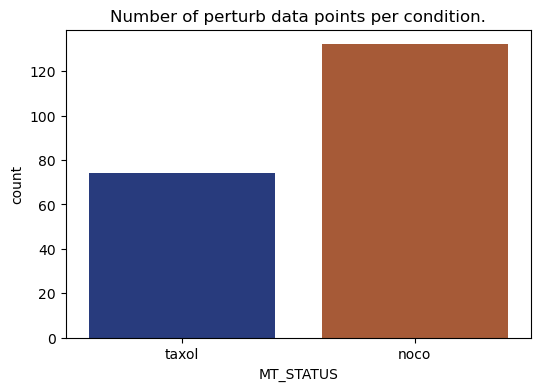

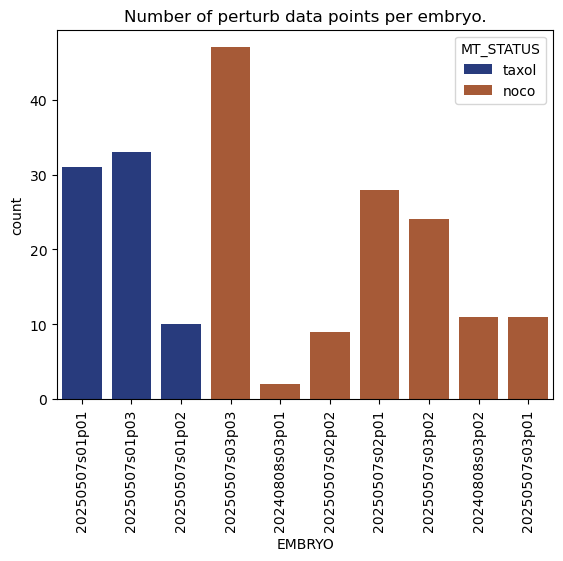

In [65]:
fig = plt.figure(figsize=(6, 4))
# Second subplot: Summary statistics

sns.countplot(data=df_results_filtered, x='MT_STATUS', hue='MT_STATUS', alpha=0.9, palette=darker_colors)
plt.title(f'Number of perturb data points per condition.')
plt.show()

sns.countplot(data=df_results_filtered, x='EMBRYO', hue='MT_STATUS', alpha=0.9, palette=darker_colors)
plt.title(f'Number of perturb data points per embryo.')
plt.xticks(rotation=90)
plt.show()

# perturb data groupped together

In [66]:
# All the parameters that we are interested in with their labels for plots:

params = ['k', 'eta_1', 'eta_2', 'elastic_viscous_ratio', 'rising_dif', 'rising_dif_norm', 'relative_dif', 'a', 'tau_r']

labels = ['$\\kappa$ (pN/$\\mathrm{\\mu m}$)', '$\\gamma_1$ (pN s/$\\mathrm{\\mu m}$)', '$\\gamma_2$ (pN s/$\\mathrm{\\mu m}$)', 'Ratio between elastic and viscous deformation', 'Displacement ($\\mathrm{\\mu m}$)', 'Displacement / Force ($\\mathrm{\\mu m}$/ pN)', 'a = Relaxation / Displacement ', 'a', '$\\tau_R$']

mapping = {'noco': 'Nocodazole', 'taxol': 'Taxol'}

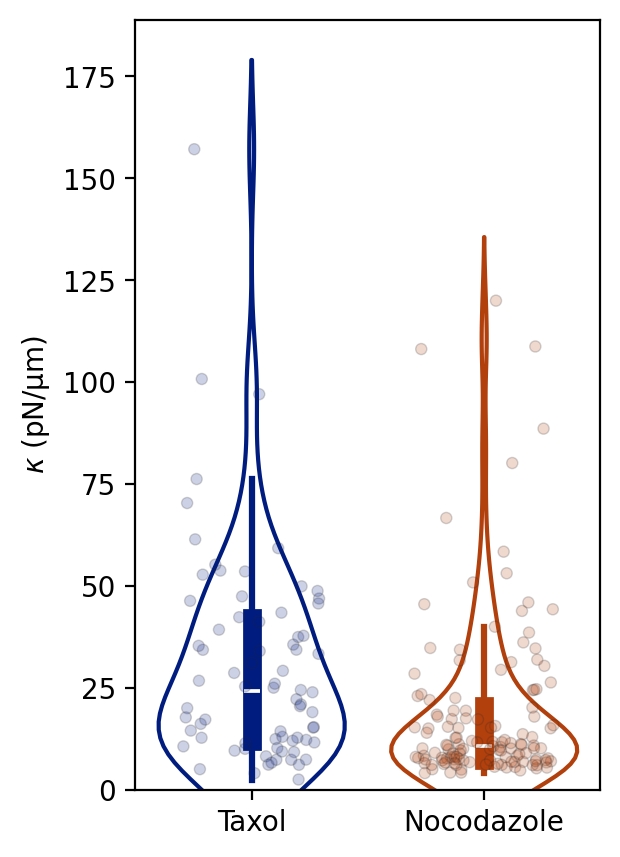

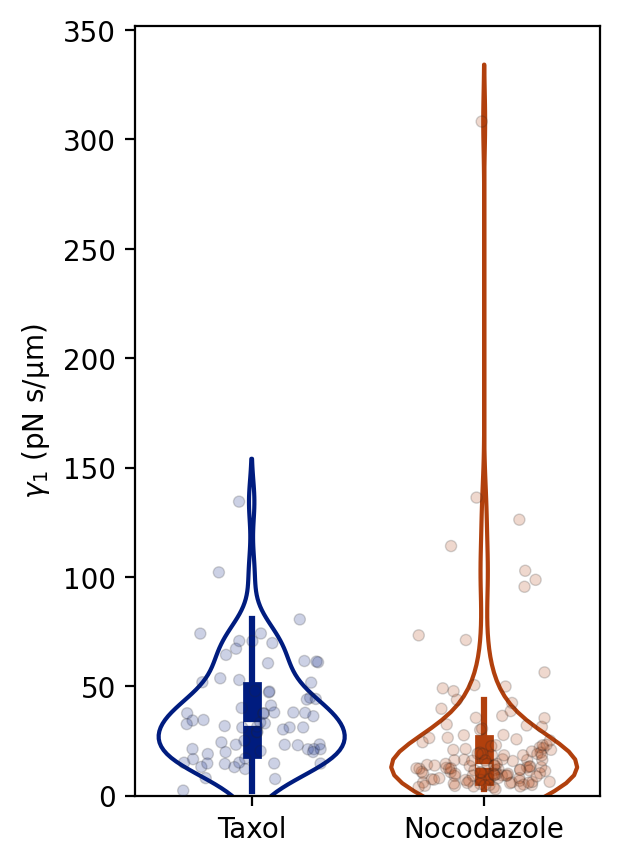

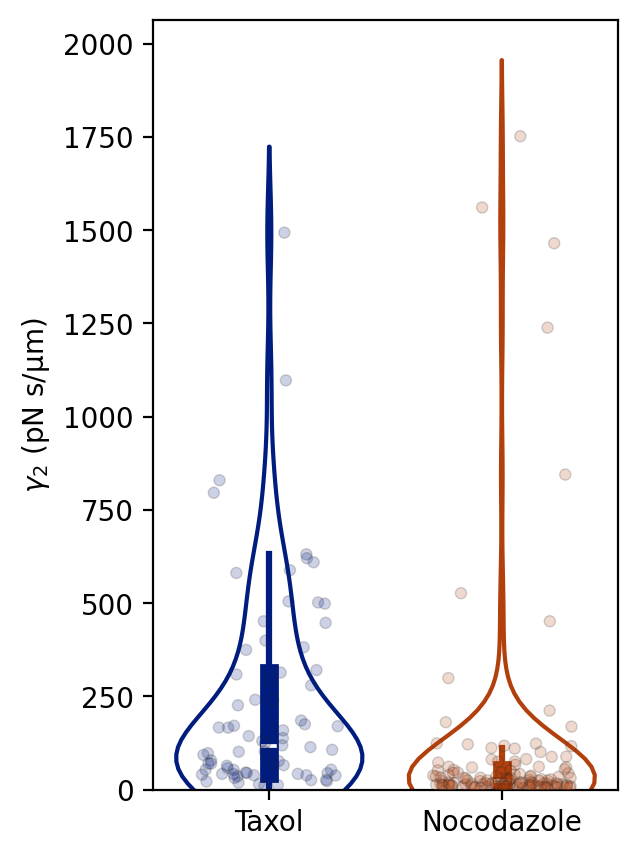

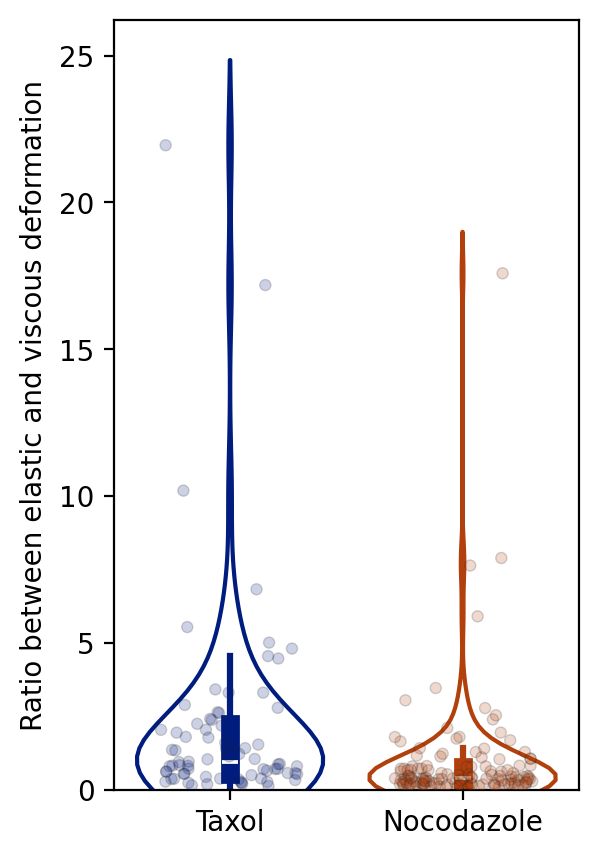

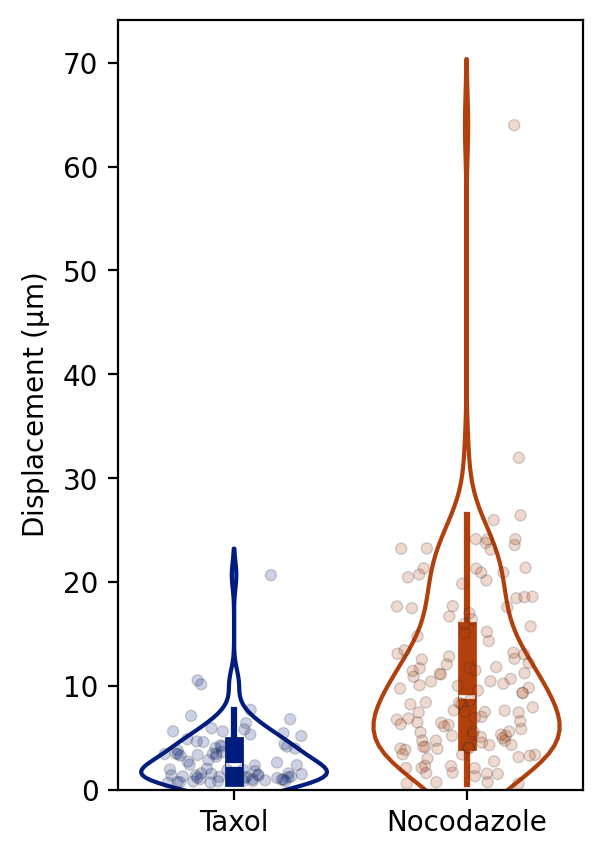

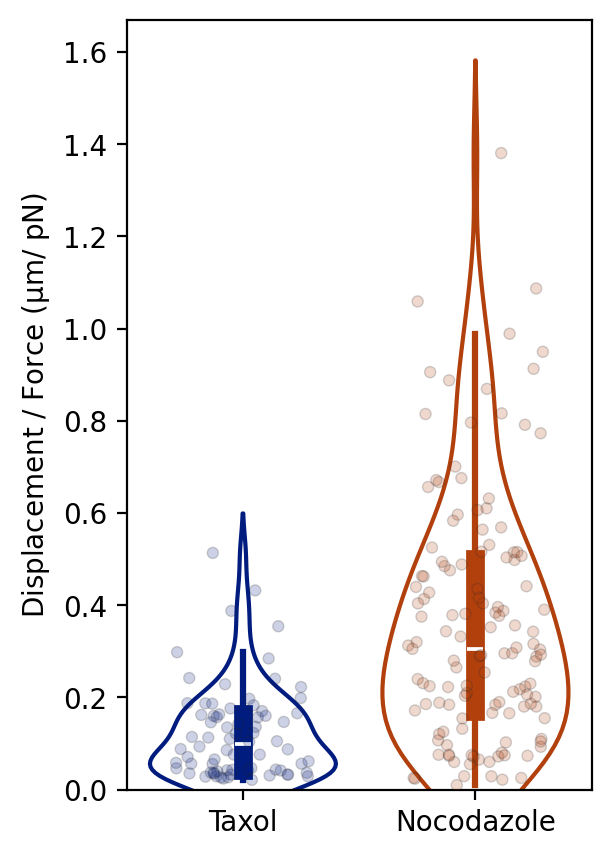

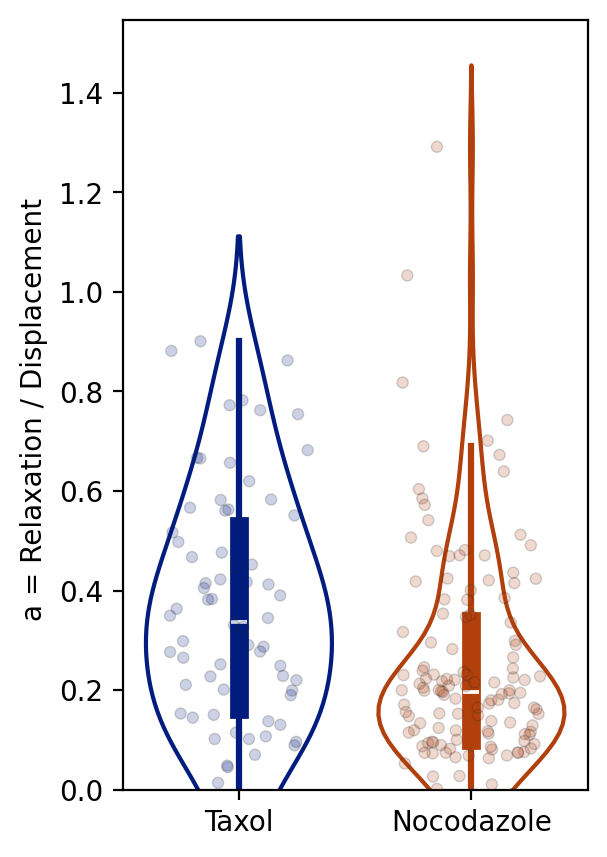

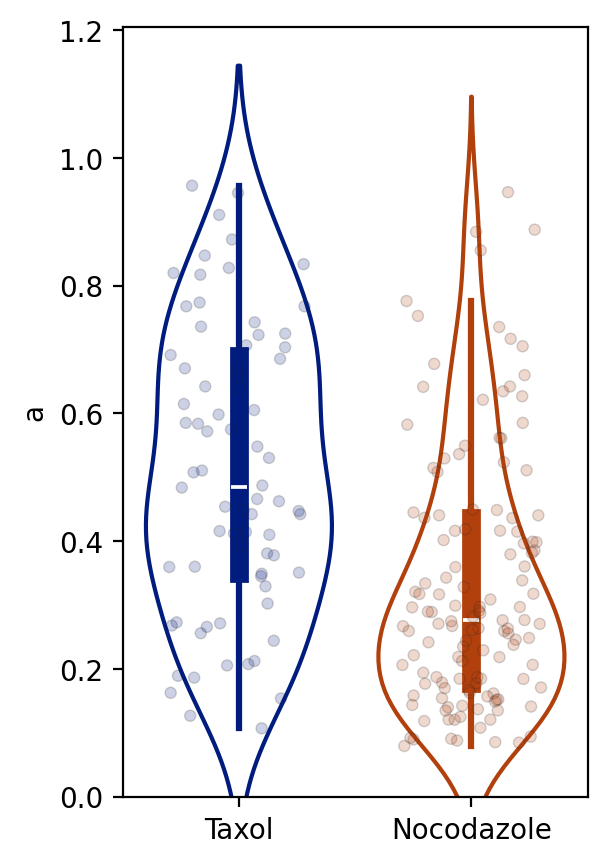

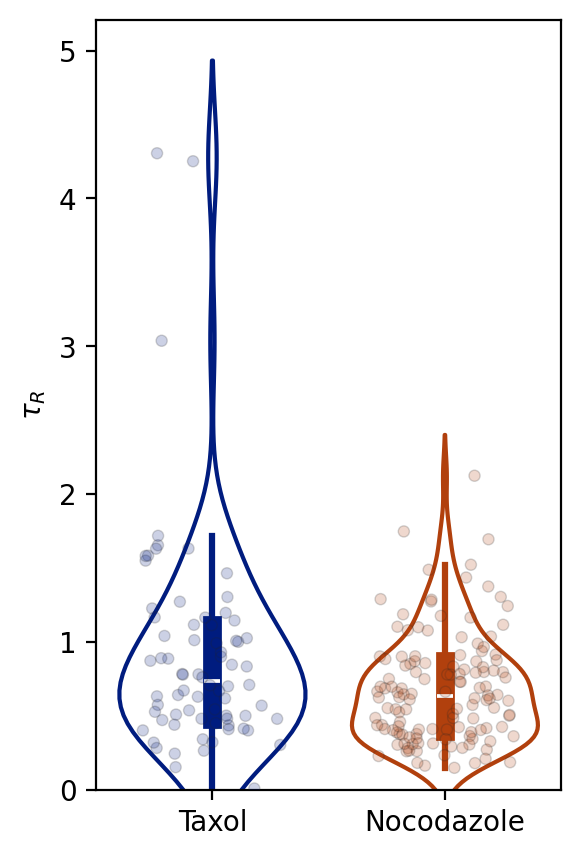

In [67]:
boxprops = dict(linestyle='-', linewidth=1, color='gray', fill=False)
for (param, label) in zip(params, labels):
    fig = plt.figure(figsize=(3, 5), dpi=200)
    # sns.boxplot(x='MT_STATUS', y=param, data=df_results_filtered, boxprops=boxprops, fliersize=0)
    sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_filtered, jitter=0.3, alpha=0.2, linewidth=0.5, legend=False, size=4, palette=darker_colors)
    sns.violinplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_filtered, fill=False, palette=darker_colors)
    plt.ylabel(label)
    plt.xlabel('')
    plt.xticks(ticks = ['taxol', 'noco'], labels=['Taxol', 'Nocodazole'])
    plt.ylim(bottom=0)
    # plt.yscale('log')
    plt.show()


# Clustered data

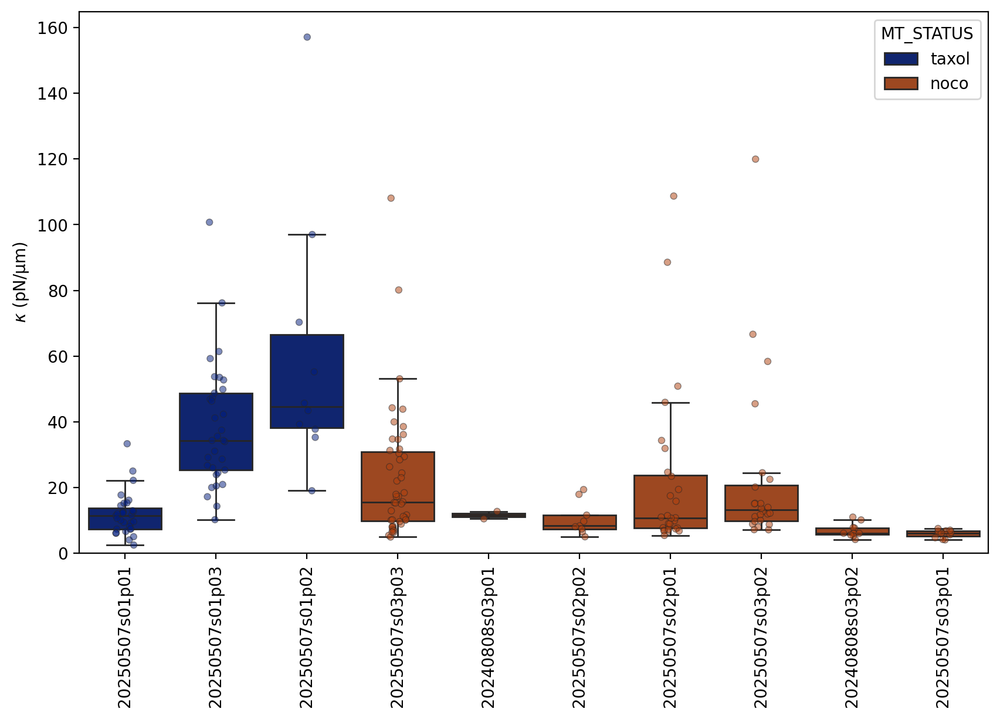

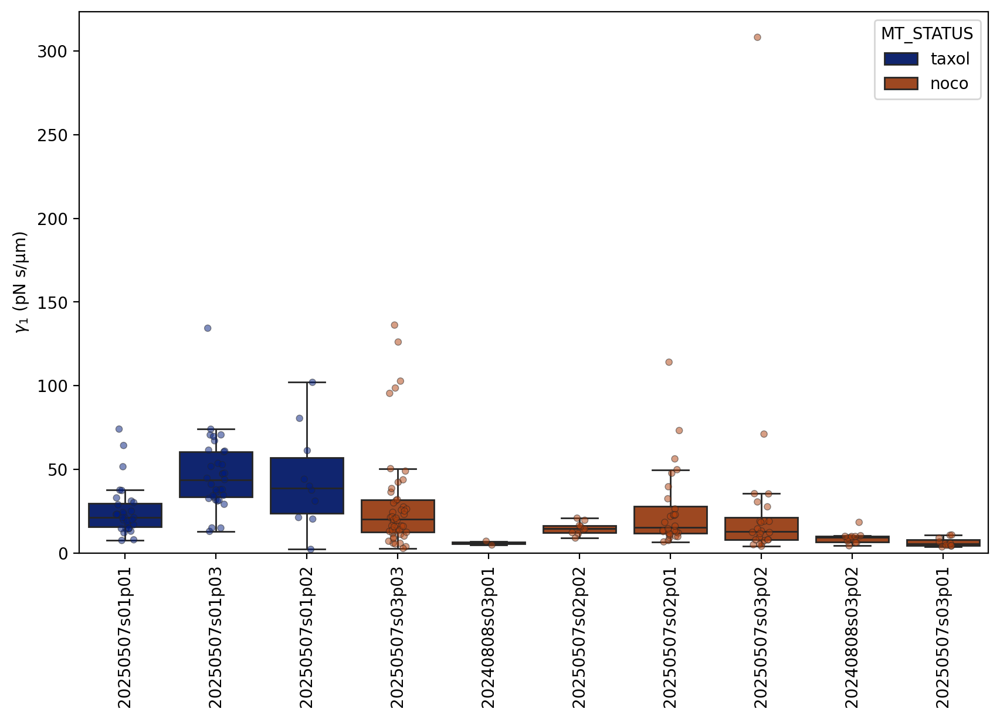

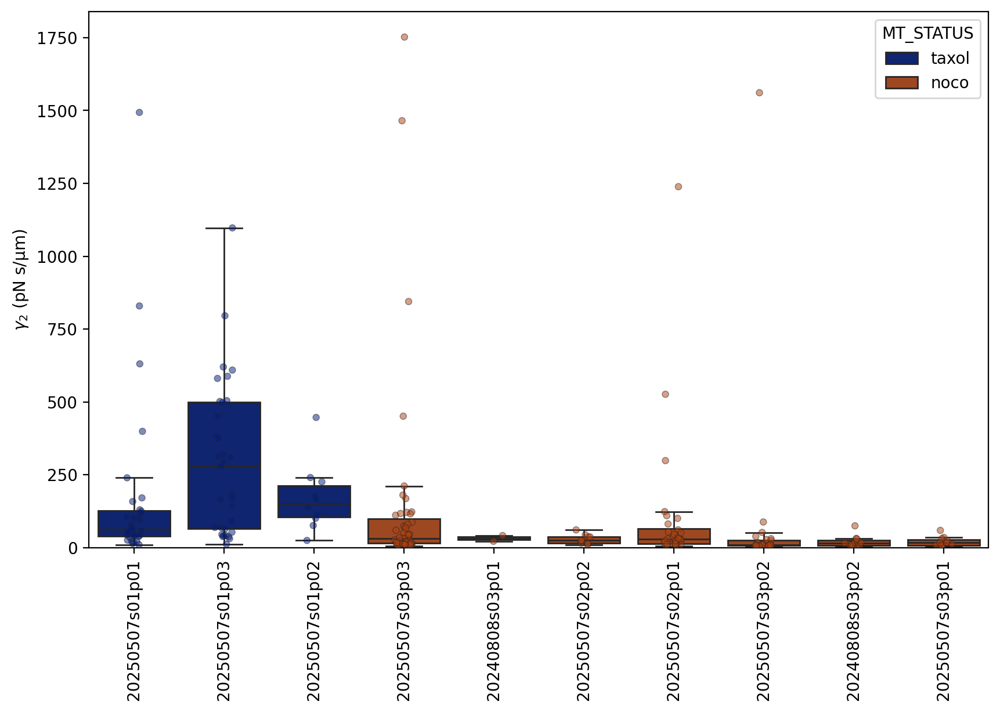

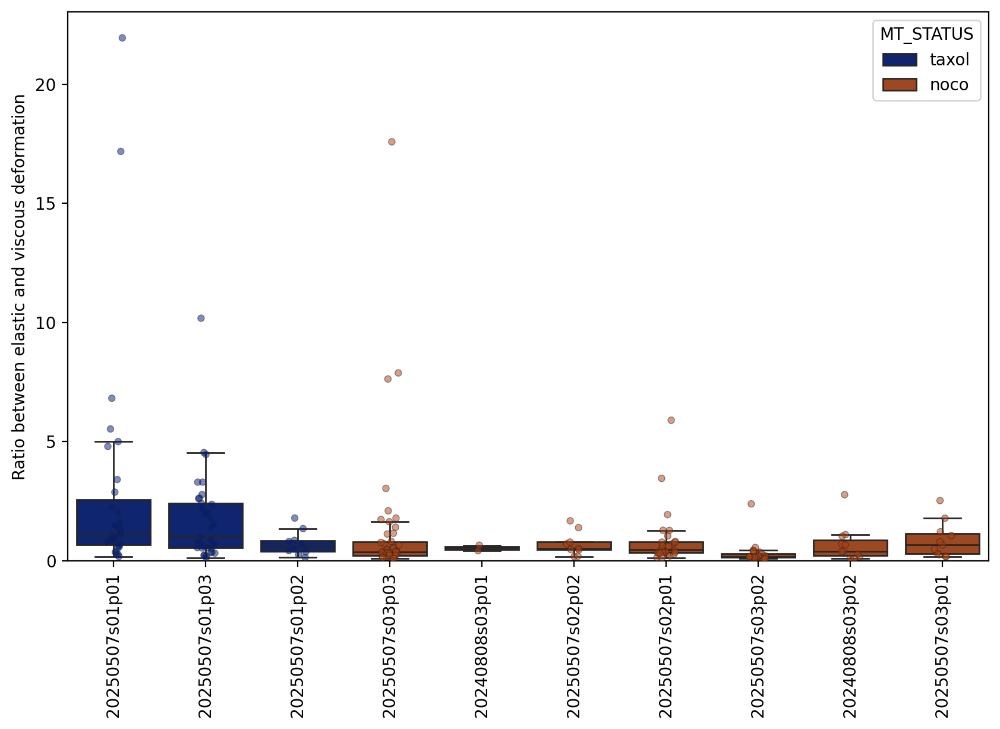

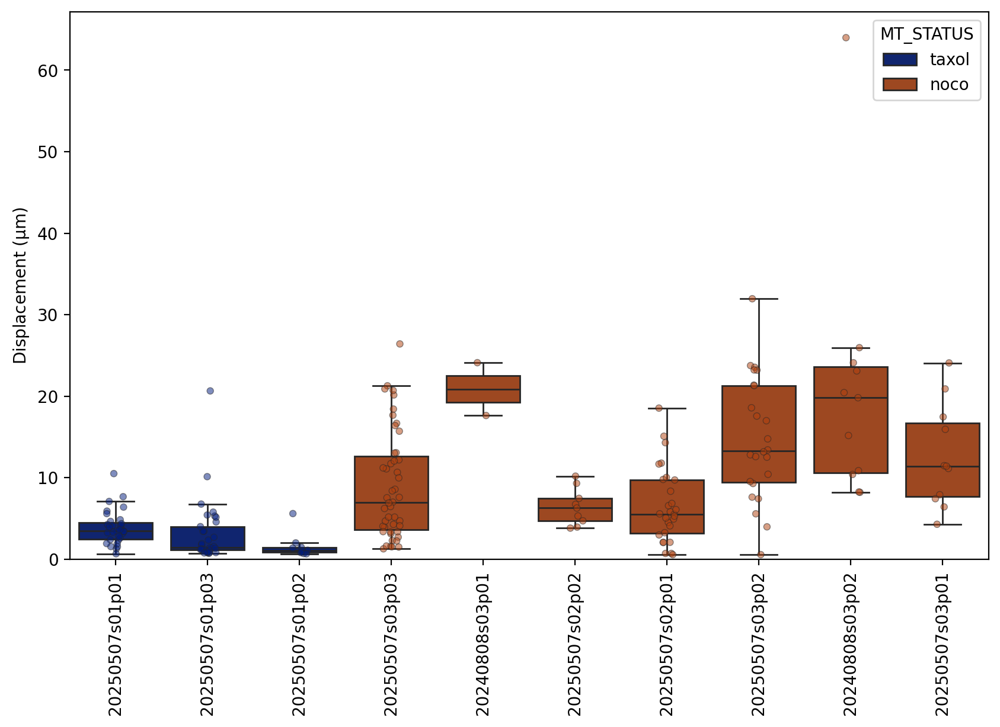

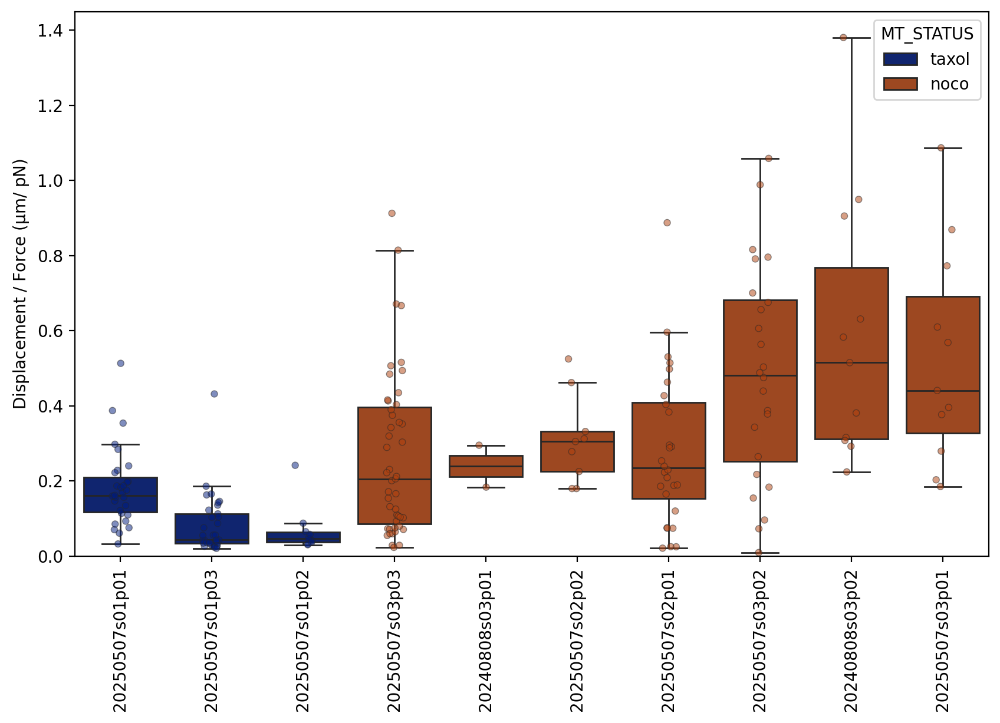

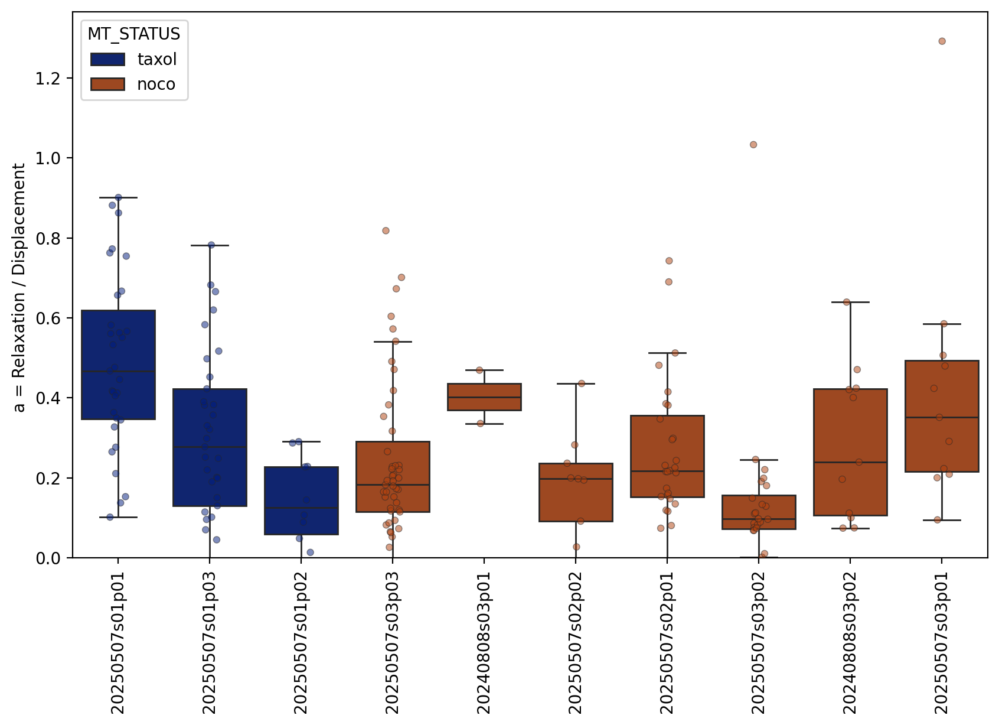

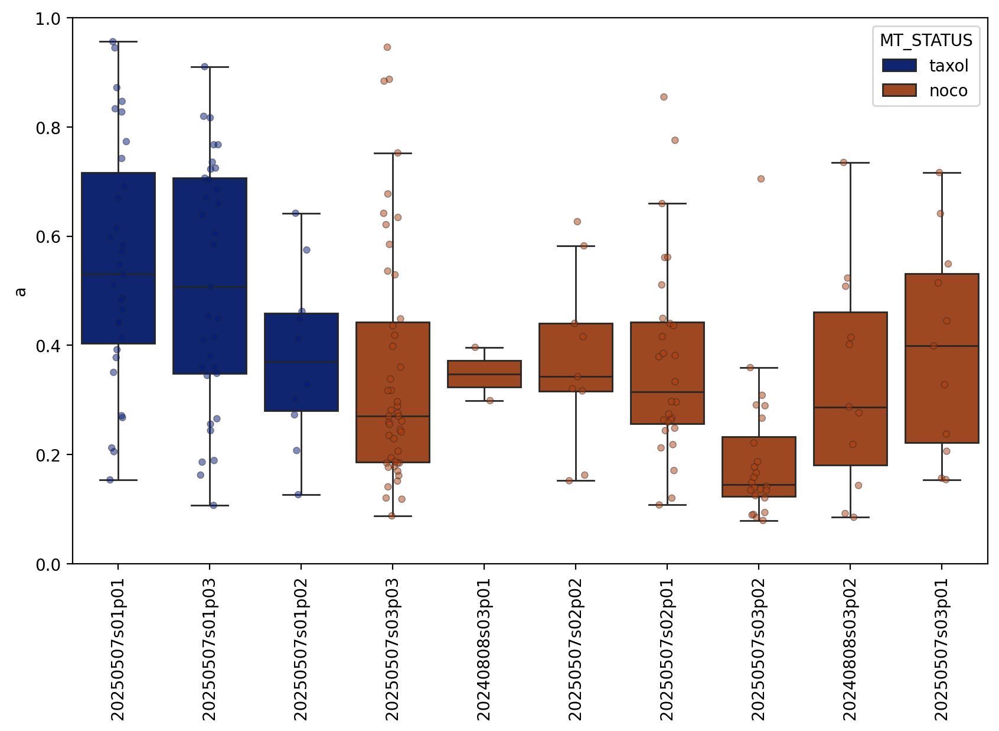

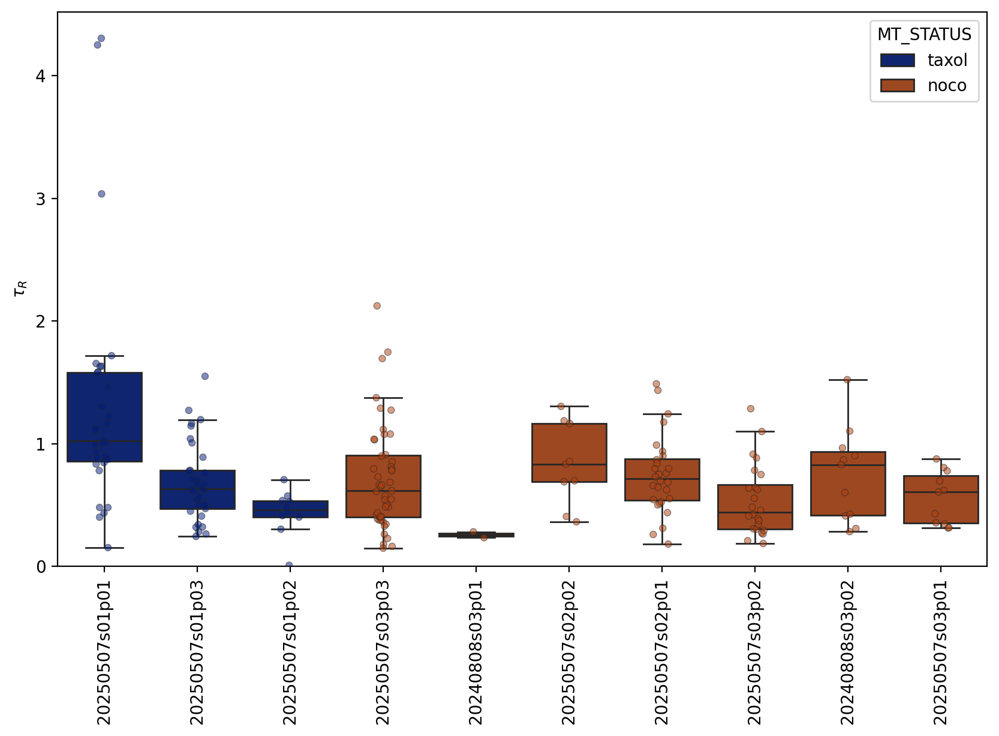

In [68]:
boxprops = dict(linestyle='-', linewidth=1, color='gray', fill=False)

for (param, label) in zip(params, labels):
    fig = plt.figure(figsize=(10, 6), dpi=200)
    sns.boxplot(x='EMBRYO', y=param, hue='MT_STATUS', data=df_results_filtered, fliersize=0, palette=darker_colors)
    sns.stripplot(x='EMBRYO', y=param, hue='MT_STATUS', data=df_results_filtered, dodge=False, jitter=True, alpha=0.5, linewidth=0.5, legend=False, size=4, palette=darker_colors)
    plt.xlabel('')
    plt.ylabel(label)
    plt.ylim(bottom=0)
    plt.xticks(rotation=90)
    plt.show()

# Binned by the pulse number

There seems to be no significant trend in the measurements from repetitive pulses. Although, there is a slight change from teh first pulse to the rest. 

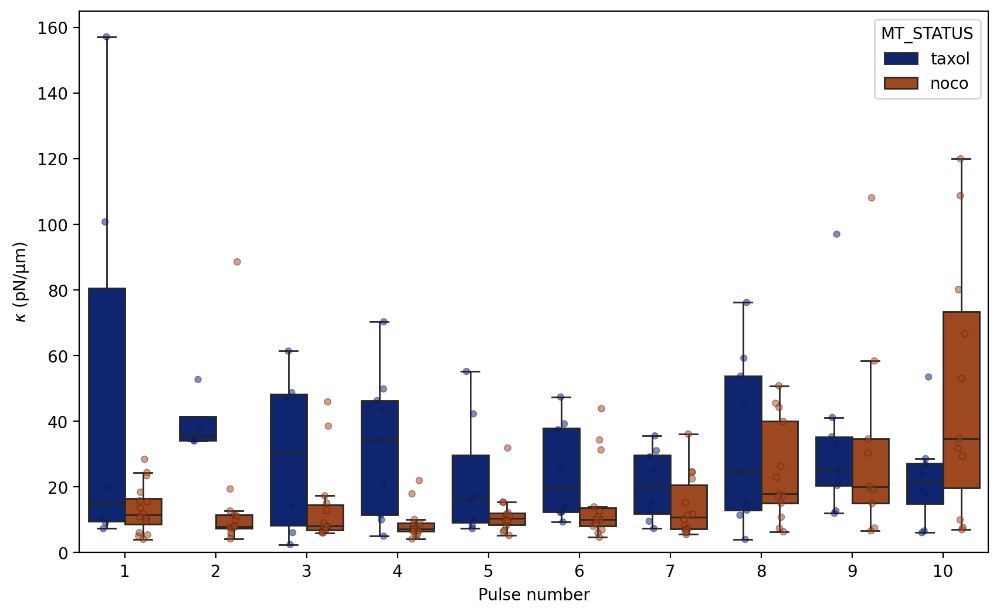

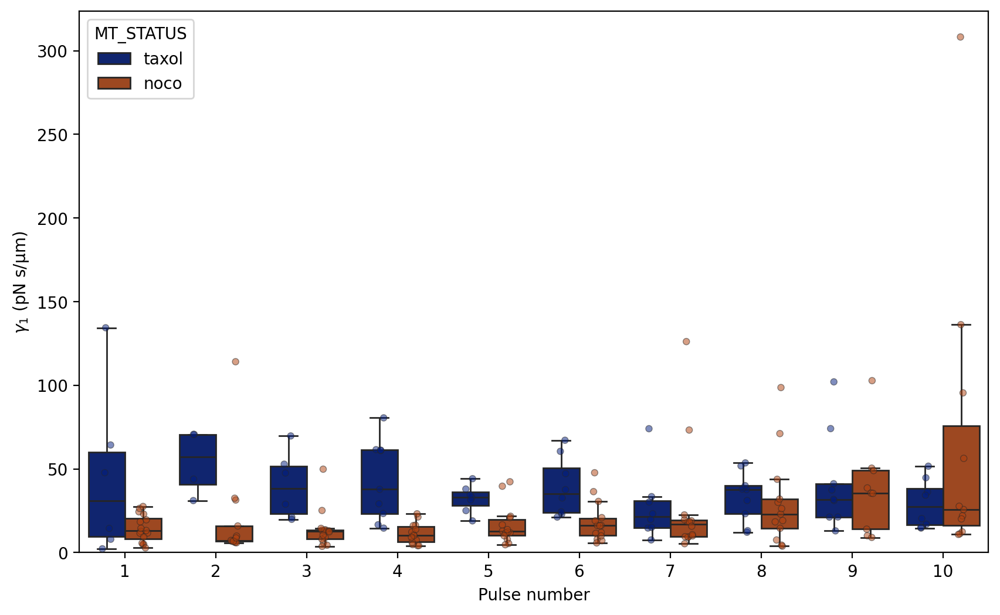

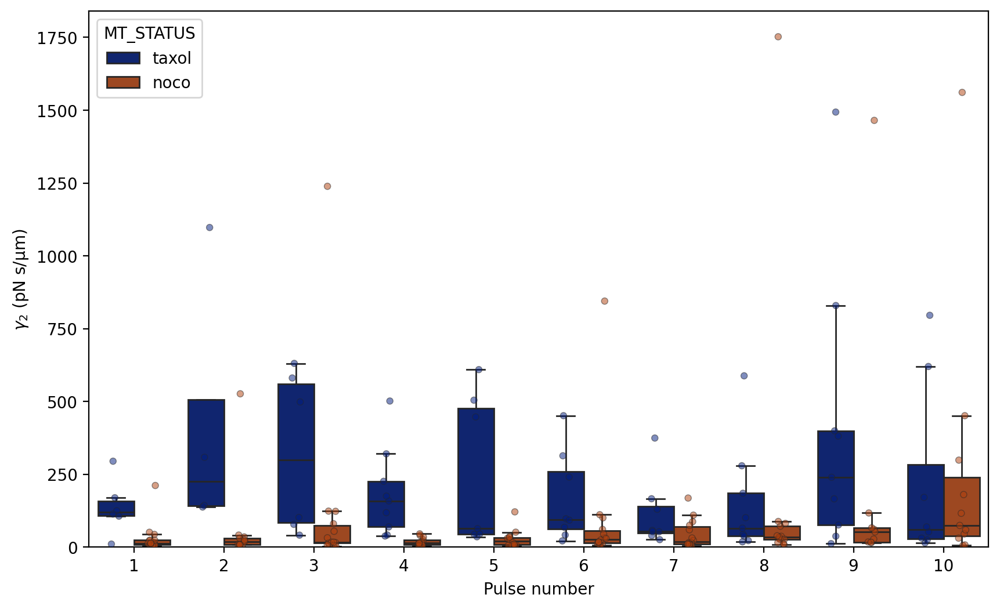

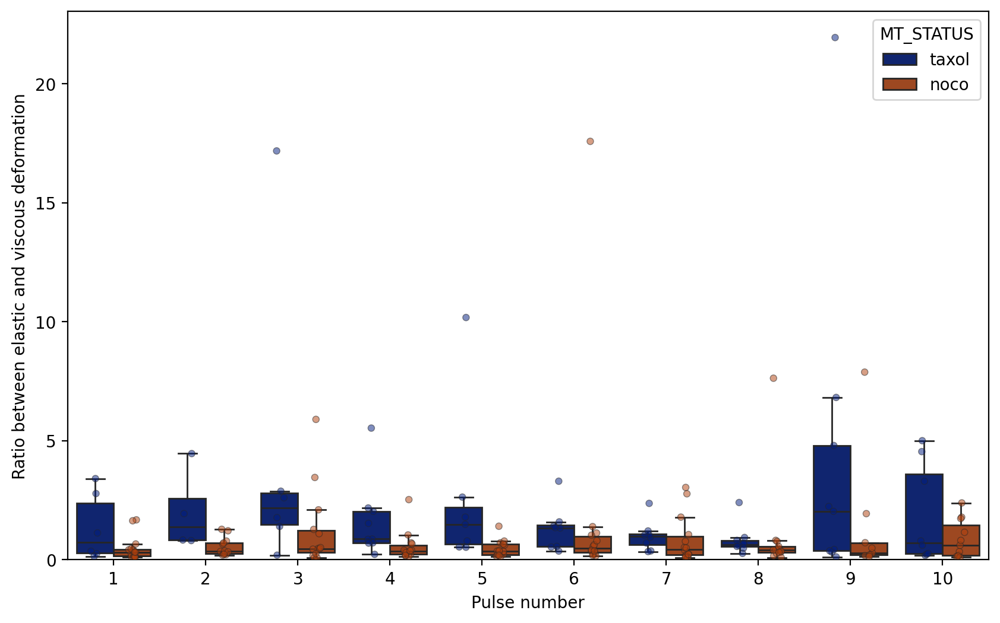

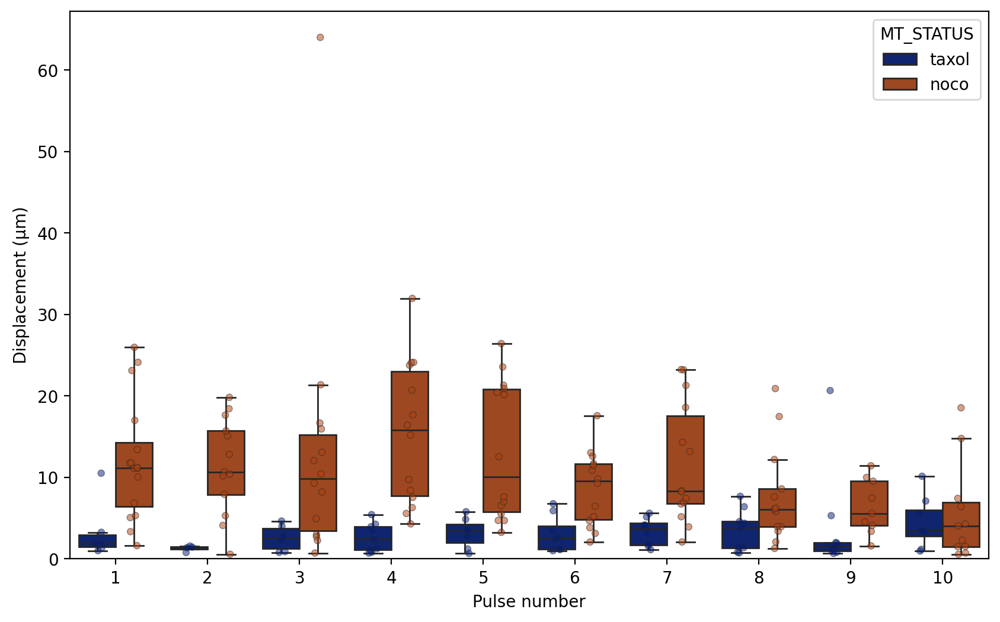

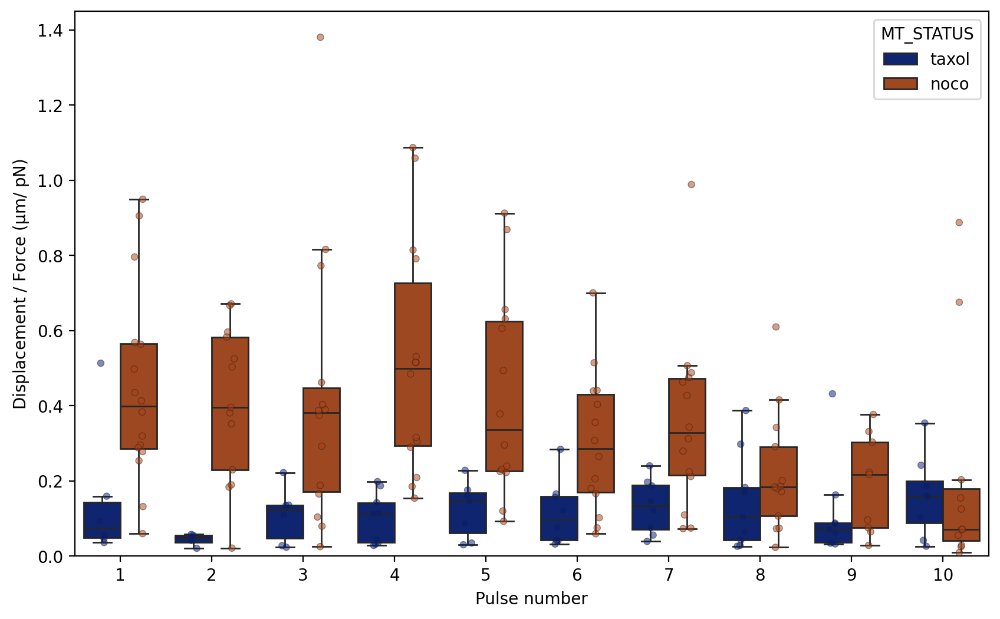

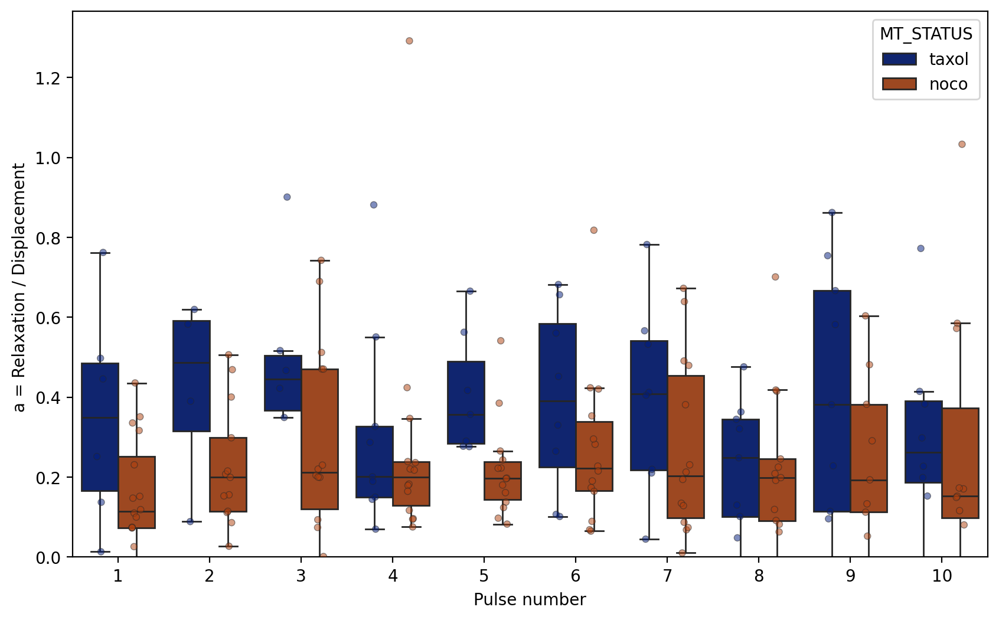

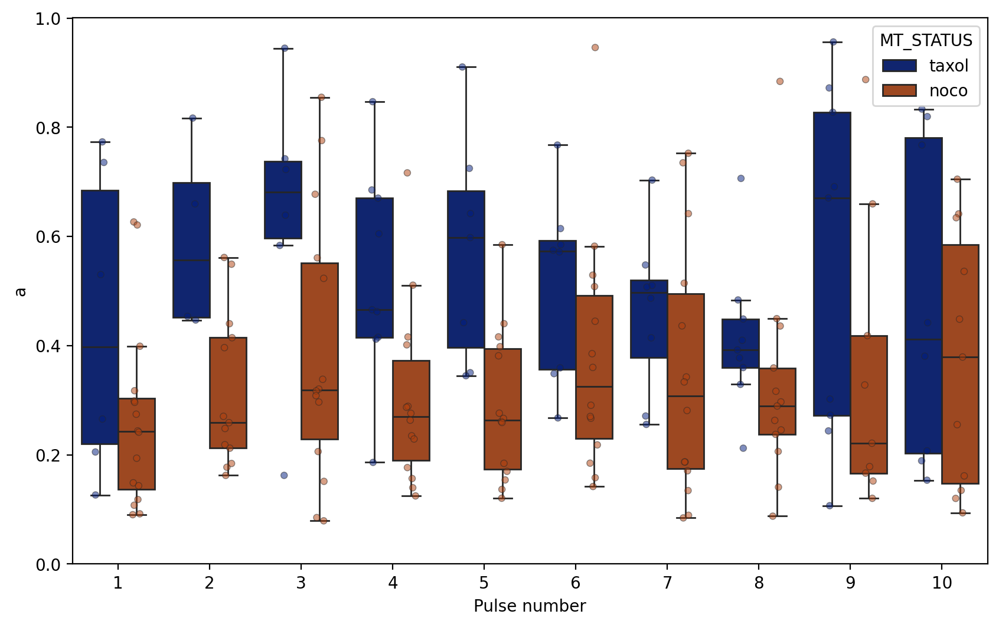

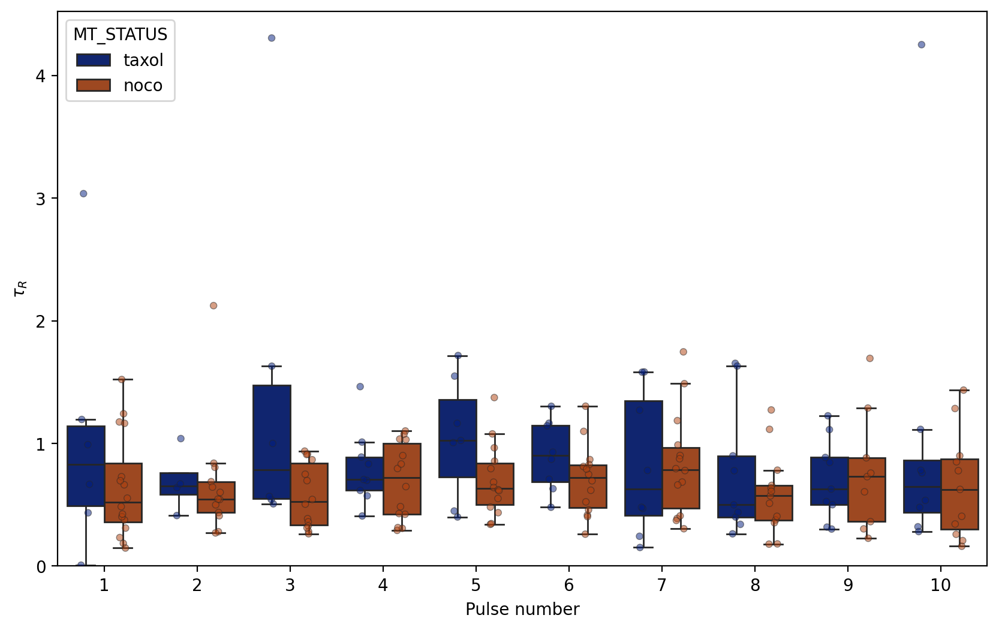

In [69]:
boxprops = dict(linestyle='-', linewidth=1, color='gray', fill=False)
for (param, label) in zip(params, labels):
    fig = plt.figure(figsize=(10, 6), dpi=200)
    sns.boxplot(x='PULSE_NUMBER', y=param, hue='MT_STATUS', data=df_results_filtered, fliersize=0, palette=darker_colors)
    sns.stripplot(x='PULSE_NUMBER', y=param, hue='MT_STATUS', data=df_results_filtered, dodge=True, jitter=True, alpha=0.5, linewidth=0.5, legend=False, size=4, palette=darker_colors)
    plt.xlabel('Pulse number')
    plt.ylabel(label)
    plt.ylim(bottom=0)

    plt.show()

# Binned by force

## Data together with rolling average

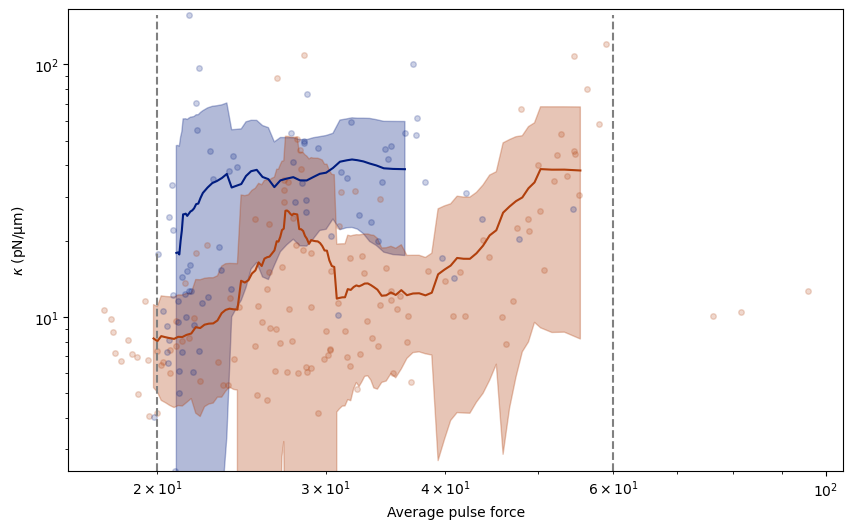

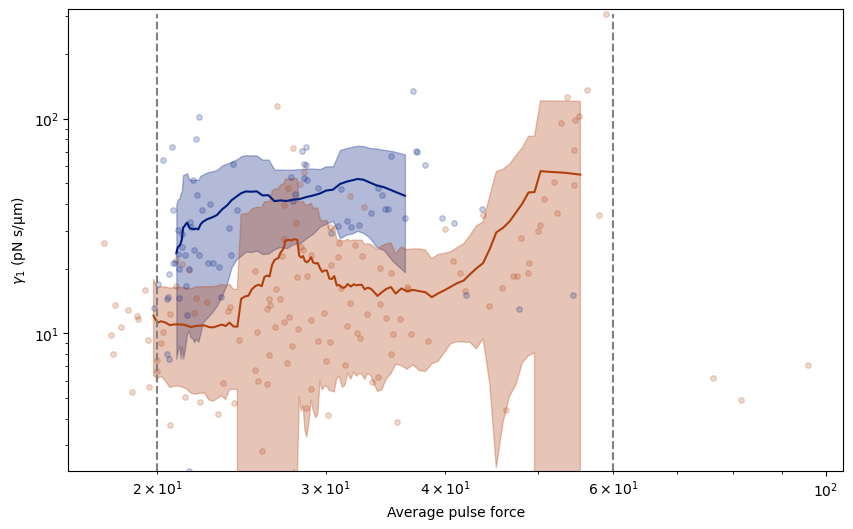

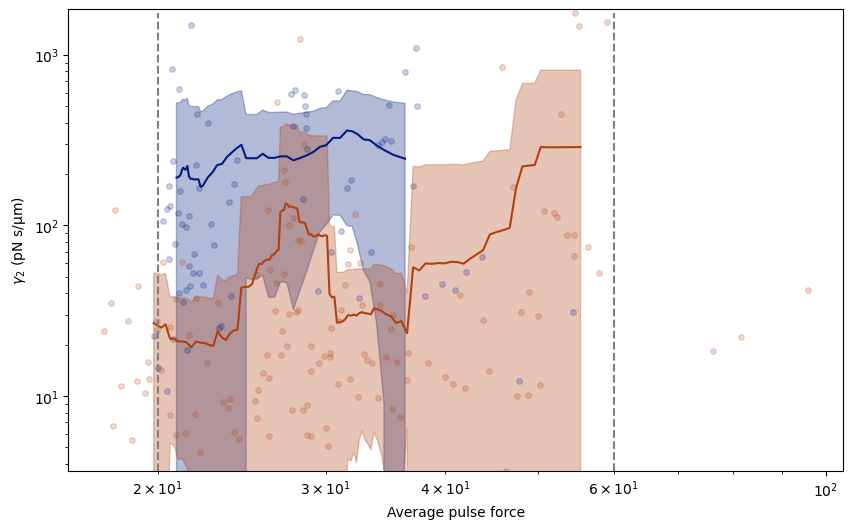

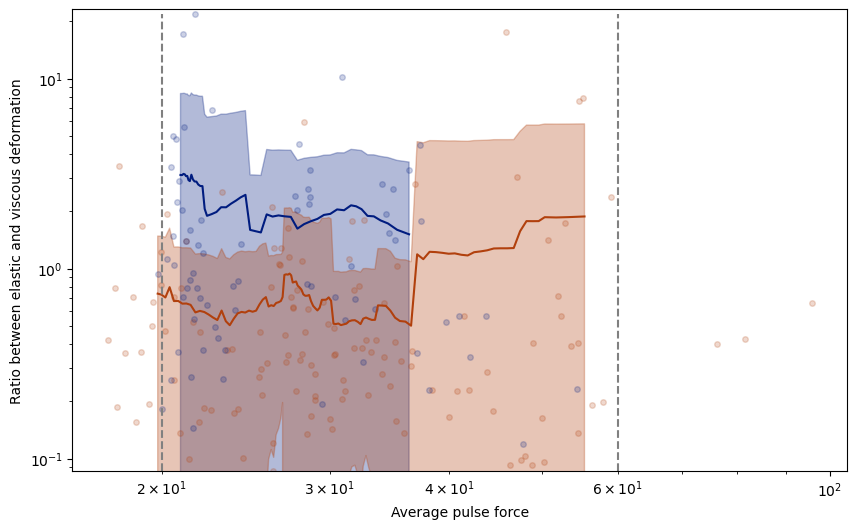

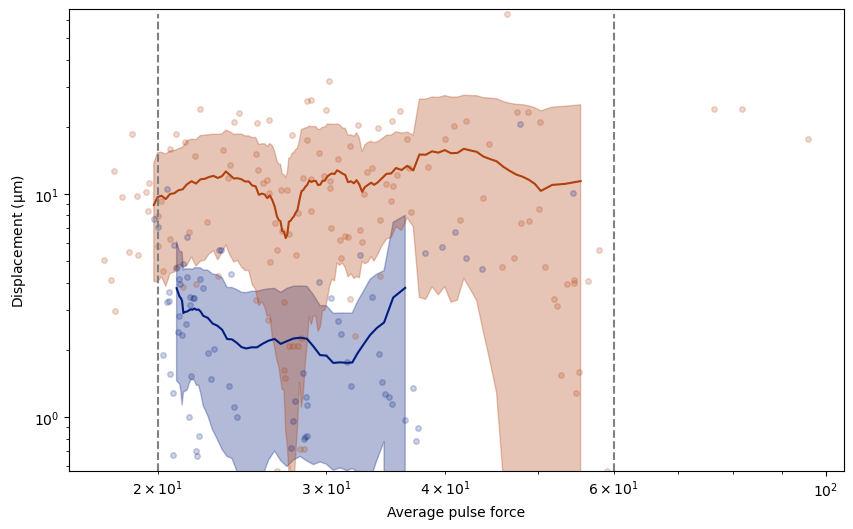

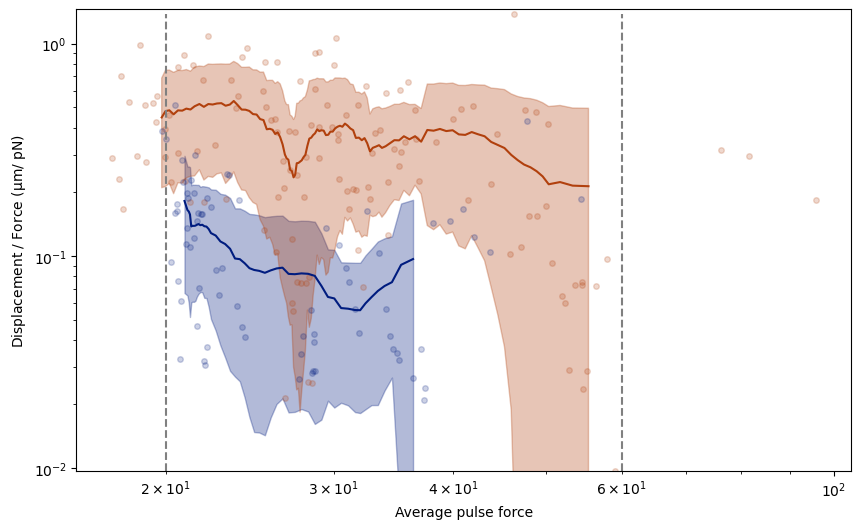

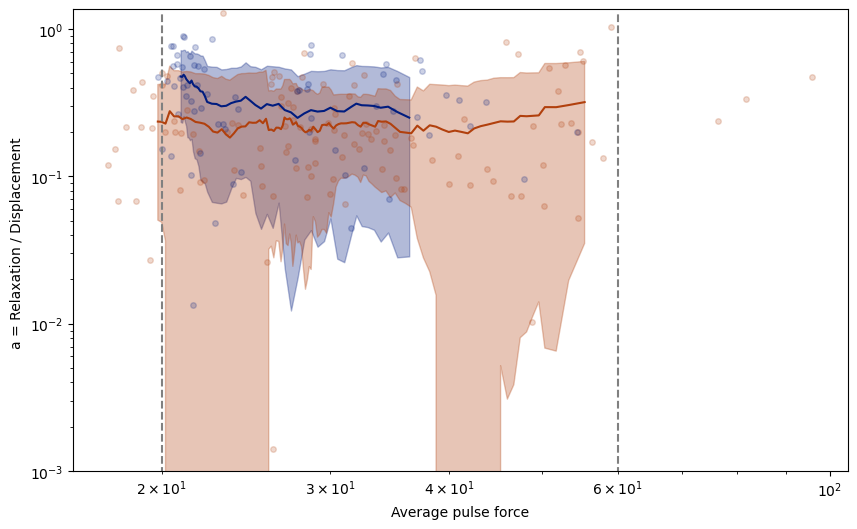

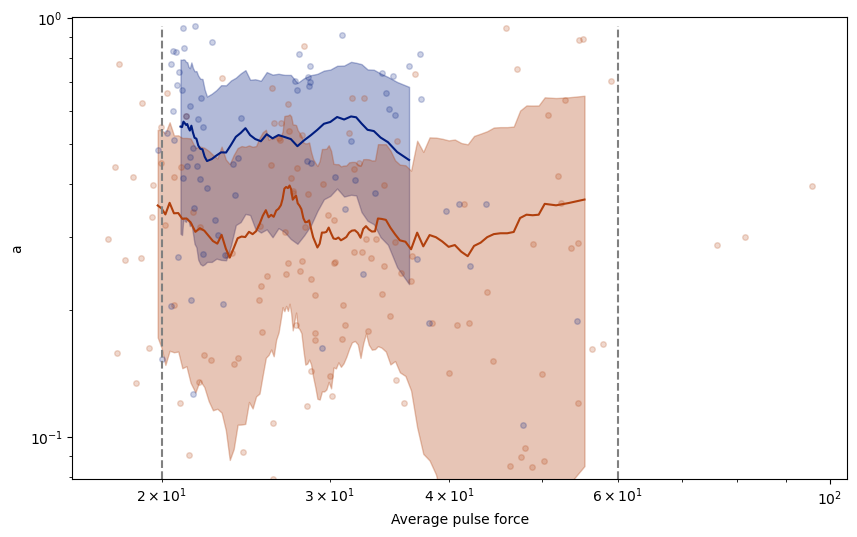

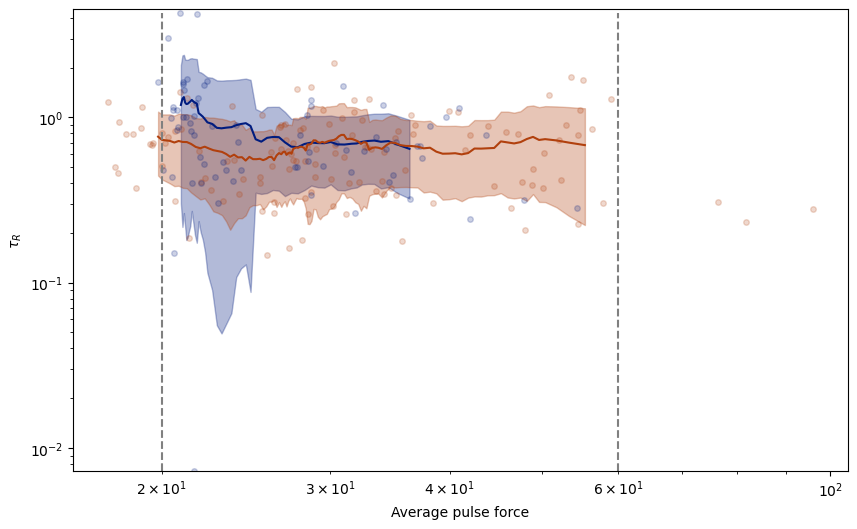

In [70]:
df_results_filtered = df_results_filtered.sort_values(by='AVG_FORCE', ascending=True)

for (param, label) in zip(params, labels):
    fig = plt.figure(figsize=(10, 6))
    # plot perturb data
    plt.plot(df_results_filtered.loc[df_results_filtered['MT_STATUS']=='noco', 'AVG_FORCE'], df_results_filtered.loc[df_results_filtered['MT_STATUS']=='noco', param], 'o', color=sns.color_palette()[3], alpha=0.2, markersize = 4)
    plt.plot(df_results_filtered.loc[df_results_filtered['MT_STATUS']=='taxol', 'AVG_FORCE'], df_results_filtered.loc[df_results_filtered['MT_STATUS']=='taxol', param], 'o', color=sns.color_palette()[1], alpha=0.2, markersize = 4)
    
    window = 25
    # plot the roling average
    plt.plot(df_results_filtered.loc[df_results_filtered['MT_STATUS']=='taxol', 'AVG_FORCE'].rolling(window=window, center=True).mean(), df_results_filtered.loc[df_results_filtered['MT_STATUS']=='taxol', param].rolling(window=window, center=True).mean(), '-', color=sns.color_palette()[1], alpha=1)

    plt.plot(df_results_filtered.loc[df_results_filtered['MT_STATUS']=='noco', 'AVG_FORCE'].rolling(window=window, center=True).mean(), df_results_filtered.loc[df_results_filtered['MT_STATUS']=='noco', param].rolling(window=window , center=True).mean(), '-', color=sns.color_palette()[3], alpha=1)

    # plot the standard deviation
    plt.fill_between(df_results_filtered.loc[df_results_filtered['MT_STATUS']=='taxol', 'AVG_FORCE'].rolling(window=window, center=True).mean(), 
    df_results_filtered.loc[df_results_filtered['MT_STATUS']=='taxol', param].rolling(window=window, center=True).mean()- df_results_filtered.loc[df_results_filtered['MT_STATUS']=='taxol', param].rolling(window=window, center=True).std(), 
    df_results_filtered.loc[df_results_filtered['MT_STATUS']=='taxol', param].rolling(window=window, center=True).mean()+ df_results_filtered.loc[df_results_filtered['MT_STATUS']=='taxol', param].rolling(window=window, center=True).std(),
    color=sns.color_palette()[1], alpha=0.3)

    plt.fill_between(df_results_filtered.loc[df_results_filtered['MT_STATUS']=='noco', 'AVG_FORCE'].rolling(window=window, center=True).mean(), 
    df_results_filtered.loc[df_results_filtered['MT_STATUS']=='noco', param].rolling(window=window, center=True).mean()- df_results_filtered.loc[df_results_filtered['MT_STATUS']=='noco', param].rolling(window=window, center=True).std(), 
    df_results_filtered.loc[df_results_filtered['MT_STATUS']=='noco', param].rolling(window=window, center=True).mean()+ df_results_filtered.loc[df_results_filtered['MT_STATUS']=='noco', param].rolling(window=window, center=True).std(),
    color=sns.color_palette()[3], alpha=0.3)

    plt.vlines(x=force_ranges, ymin=df_results_filtered[param].min(), ymax=df_results_filtered[param].max(), color='gray', linestyle='--', label='Force range')


    plt.xlabel('Average pulse force')
    plt.ylabel(label)
    plt.ylim(bottom=max(df_results_filtered[param].min(), 0.001))
    # plt.xlim(left=0)
    plt.xscale('log')
    plt.yscale('log')
    plt.show()

## Bootstrapping the data

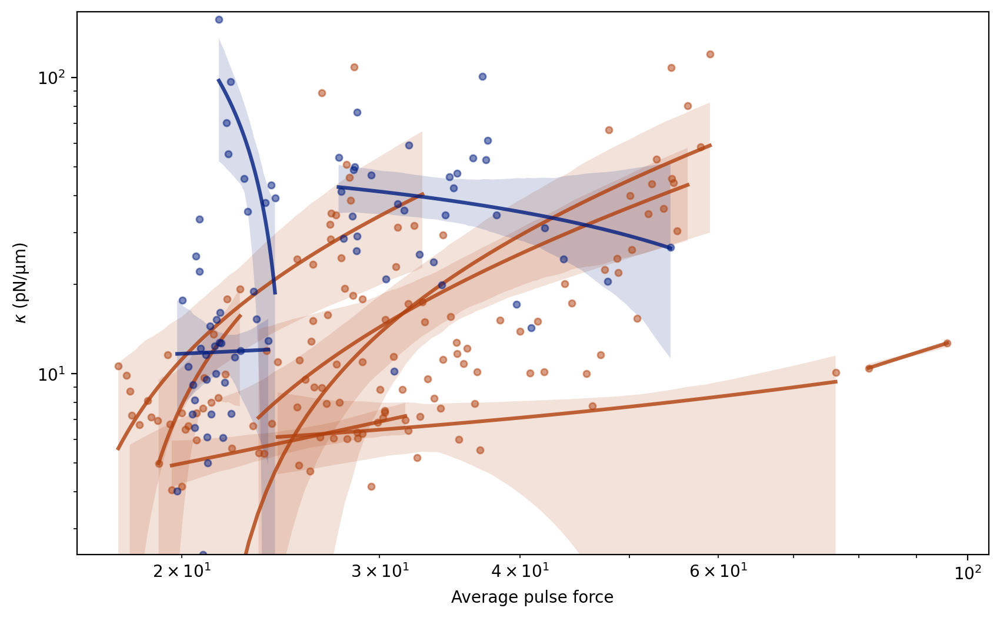

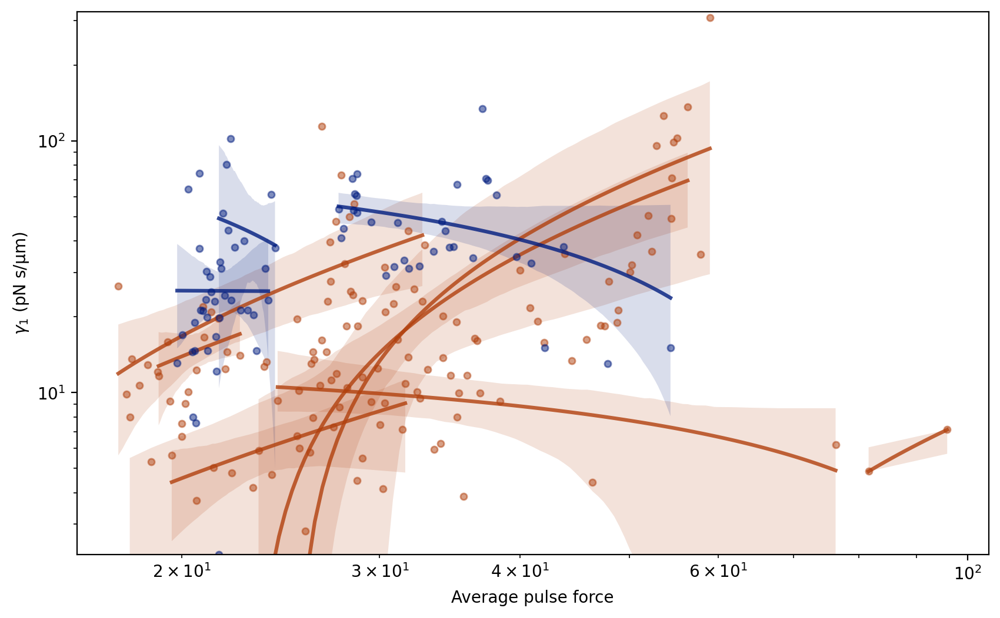

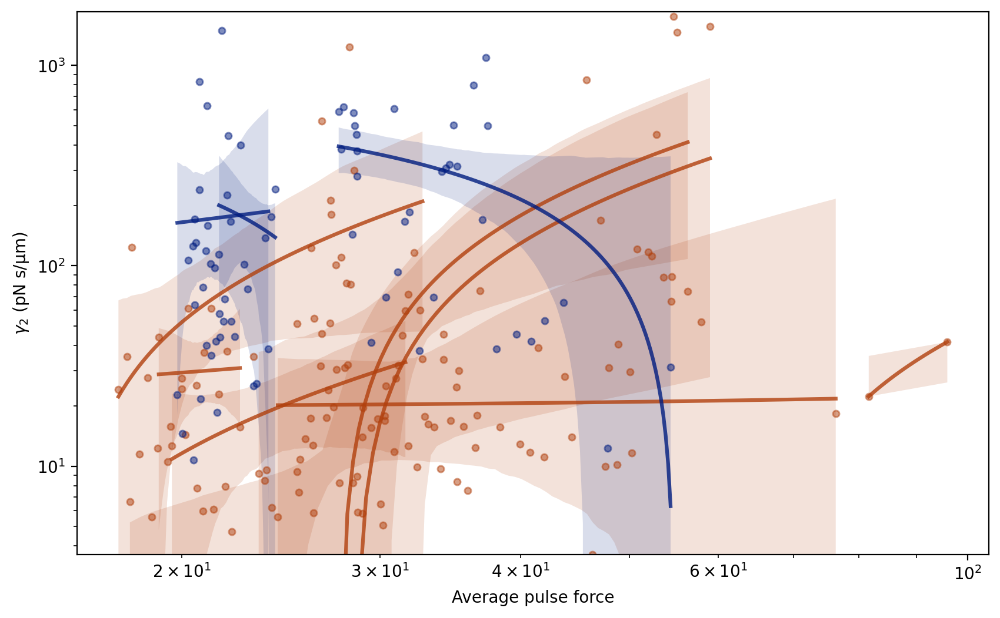

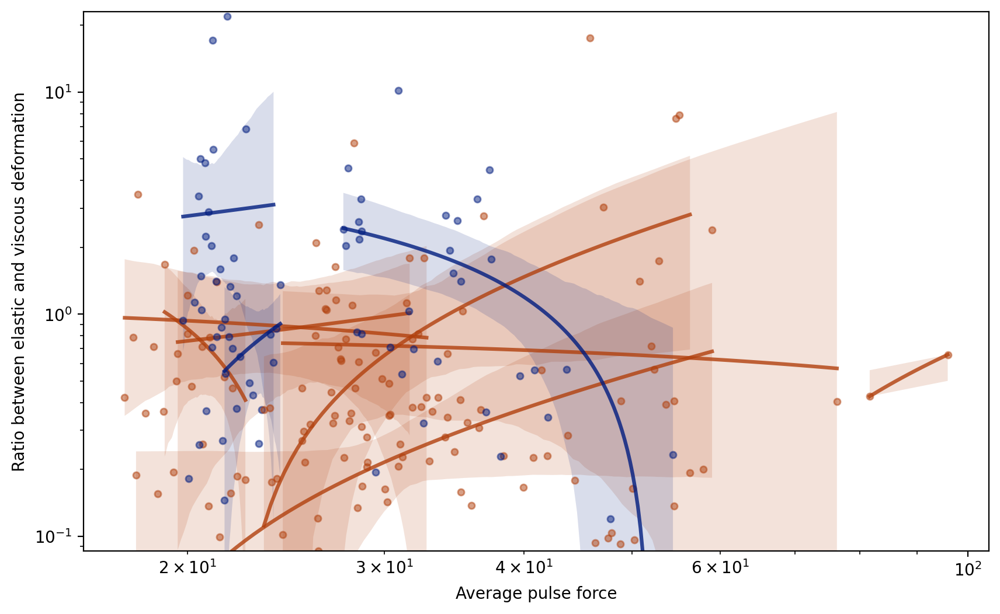

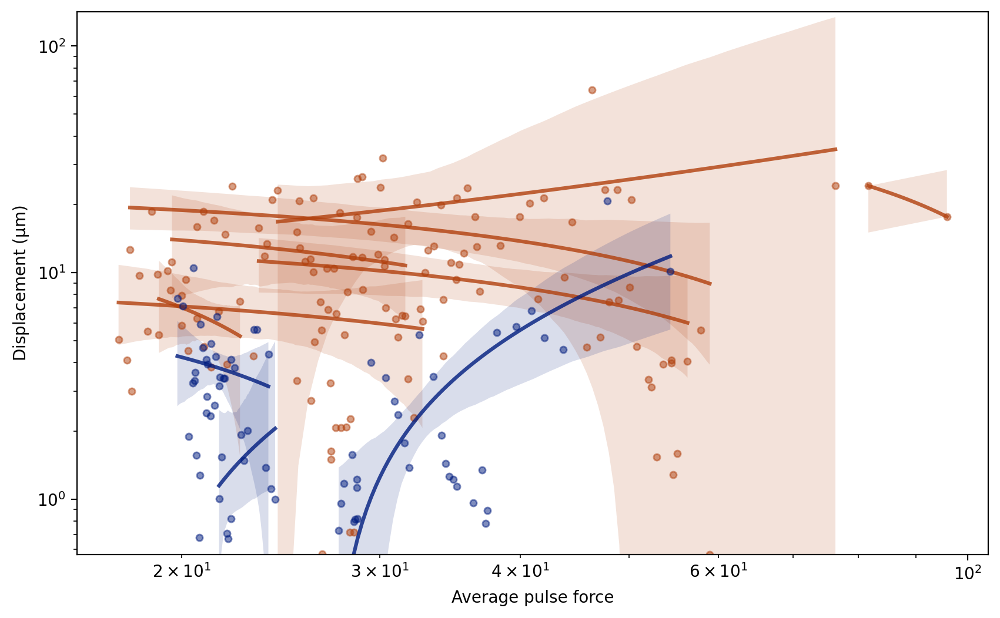

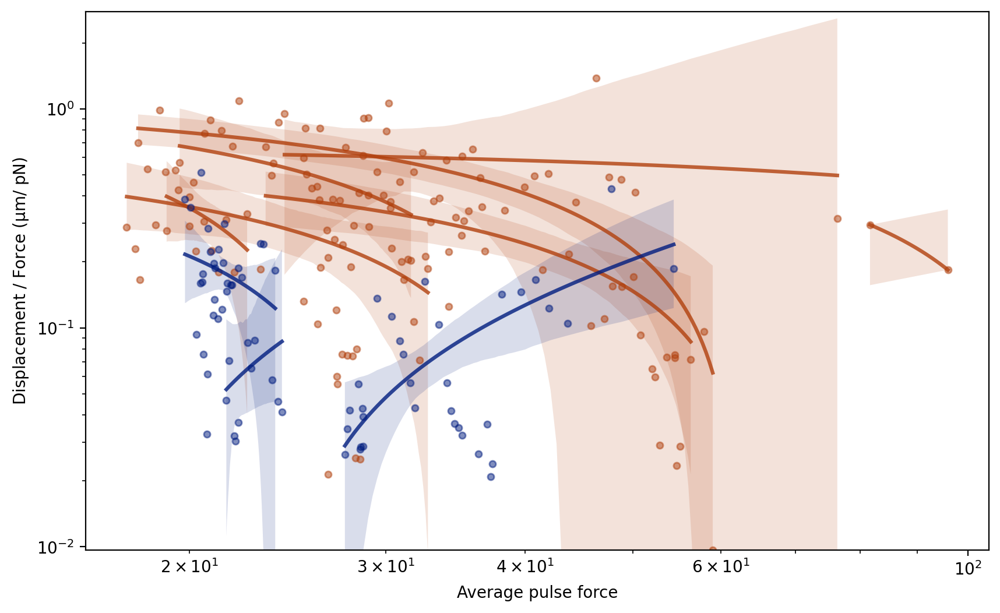

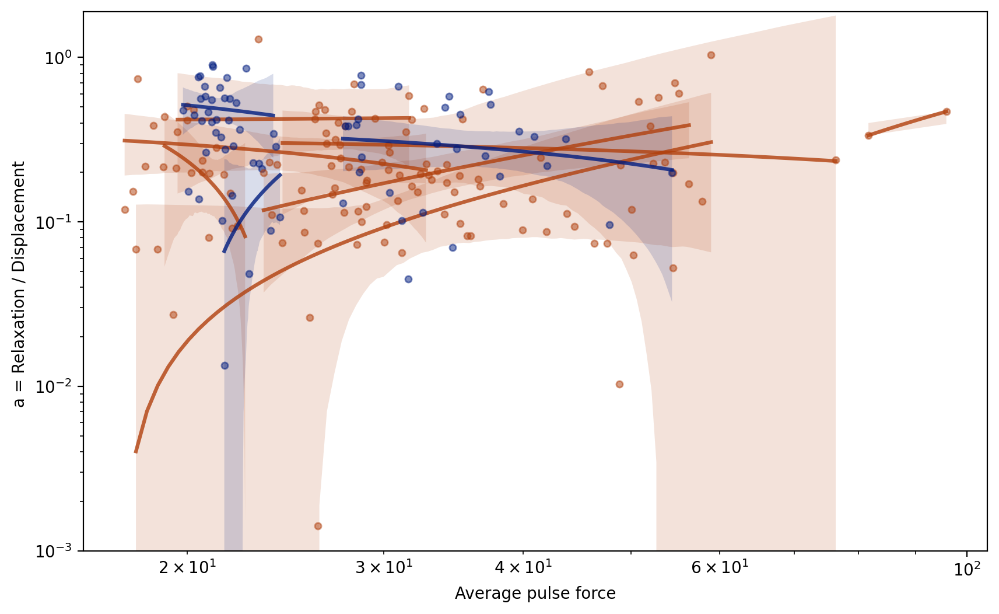

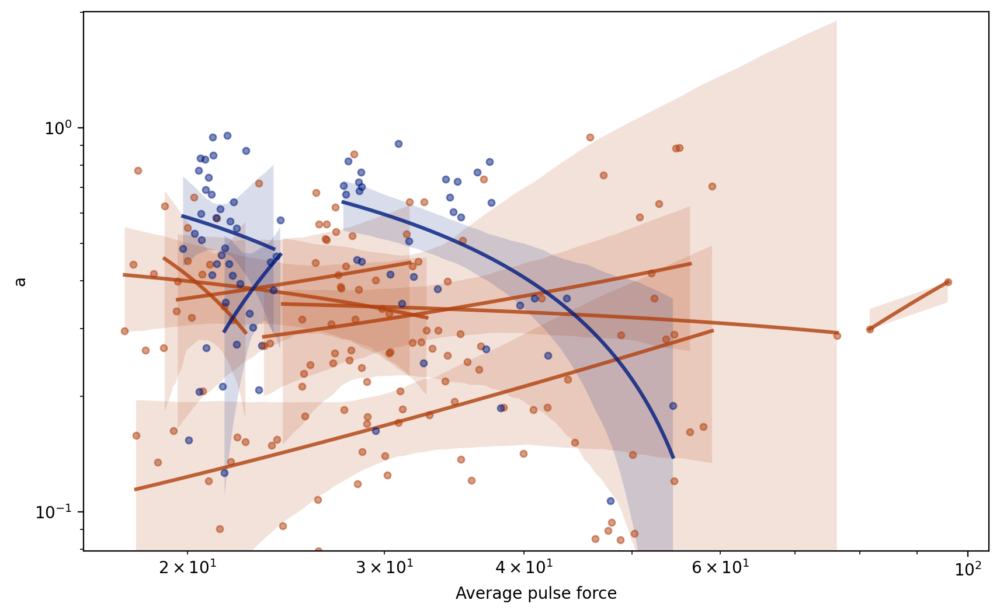

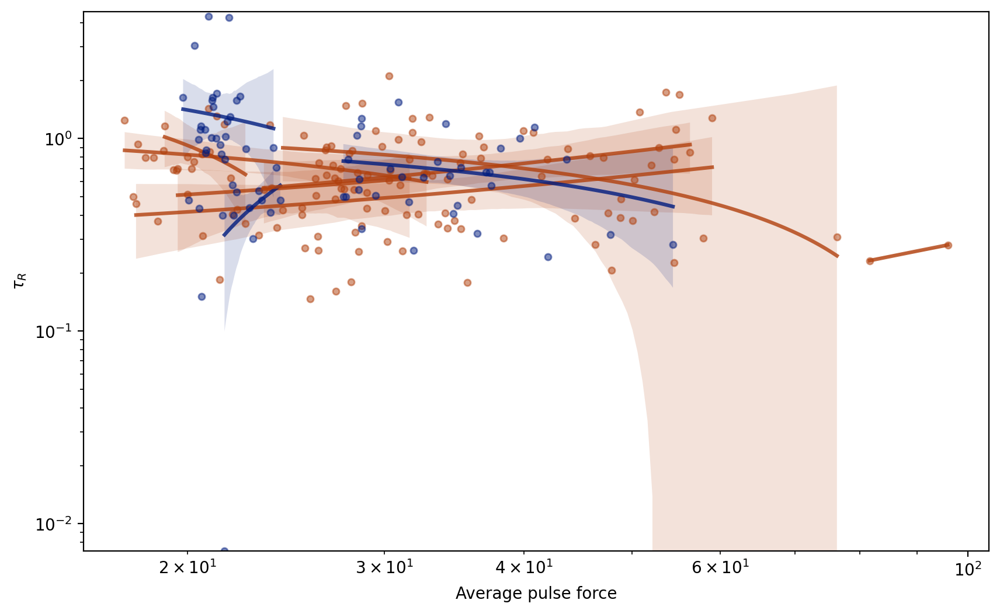

In [71]:
rng = np.random.default_rng()

df_results_filtered = df_results_filtered.sort_values(by='AVG_FORCE', ascending=True)

for (param, label) in zip(params, labels):
    fig = plt.figure(figsize=(10, 6), dpi=200)
    # plot perturb data
    for (i, embryo) in enumerate(df_results_filtered['EMBRYO'].unique()):
        plt.plot(df_results_filtered.loc[(df_results_filtered['MT_STATUS']=='noco')&(df_results_filtered['EMBRYO']==embryo), 'AVG_FORCE'], df_results_filtered.loc[(df_results_filtered['MT_STATUS']=='noco')&(df_results_filtered['EMBRYO']==embryo), param], 'o', color=sns.color_palette()[3], alpha=0.5, markersize = 4, label=embryo)
        plt.plot(df_results_filtered.loc[(df_results_filtered['MT_STATUS']=='taxol')&(df_results_filtered['EMBRYO']==embryo), 'AVG_FORCE'], df_results_filtered.loc[(df_results_filtered['MT_STATUS']=='taxol')&(df_results_filtered['EMBRYO']==embryo), param], 'o', color=sns.color_palette()[1], alpha=0.5, markersize = 4, label=embryo)
        
        if len(df_results_filtered[(df_results_filtered['MT_STATUS']=='taxol')&(df_results_filtered['EMBRYO']==embryo)].dropna()) > 0:
            sns.regplot(data=df_results_filtered[(df_results_filtered['MT_STATUS']=='taxol')&(df_results_filtered['EMBRYO']==embryo)], x='AVG_FORCE', y=param, ci=95, robust=False, marker='', line_kws=dict(color=sns.color_palette()[1], alpha=0.8))

        if len(df_results_filtered[(df_results_filtered['MT_STATUS']=='noco')&(df_results_filtered['EMBRYO']==embryo)].dropna()) > 0:
            sns.regplot(data=df_results_filtered[(df_results_filtered['MT_STATUS']=='noco')&(df_results_filtered['EMBRYO']==embryo)], x='AVG_FORCE', y=param, ci=95, robust=False, marker='', line_kws=dict(color=sns.color_palette()[3], alpha=0.8))
    
    plt.xlabel('Average pulse force')
    plt.ylabel(label)
    # plt.legend()
    plt.ylim(bottom=max(df_results_filtered[param].min(), 0.001))
    # plt.xlim(left=0)
    plt.xscale('log')
    plt.yscale('log')
    plt.show()

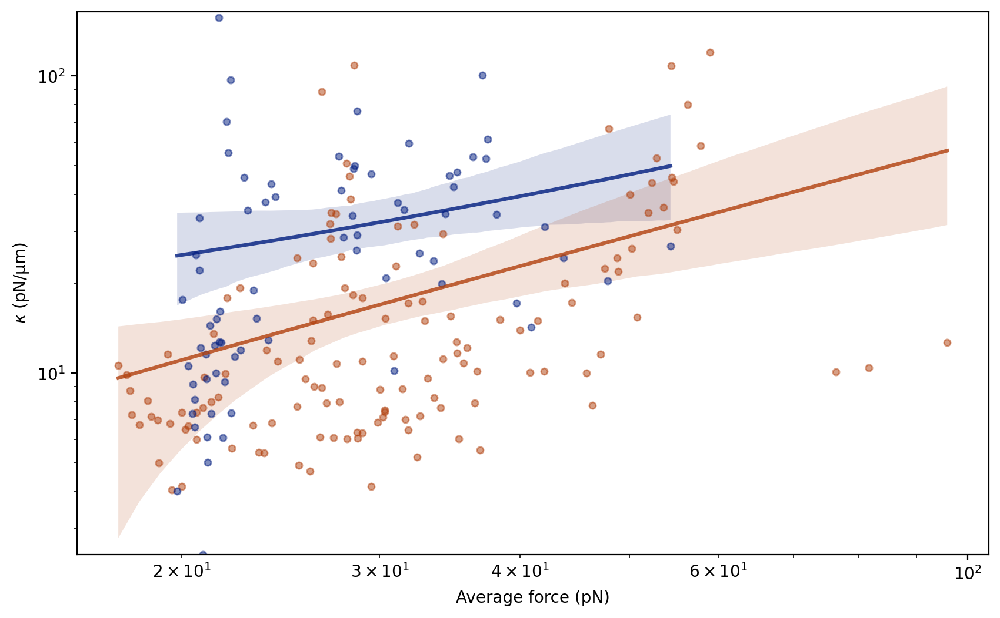

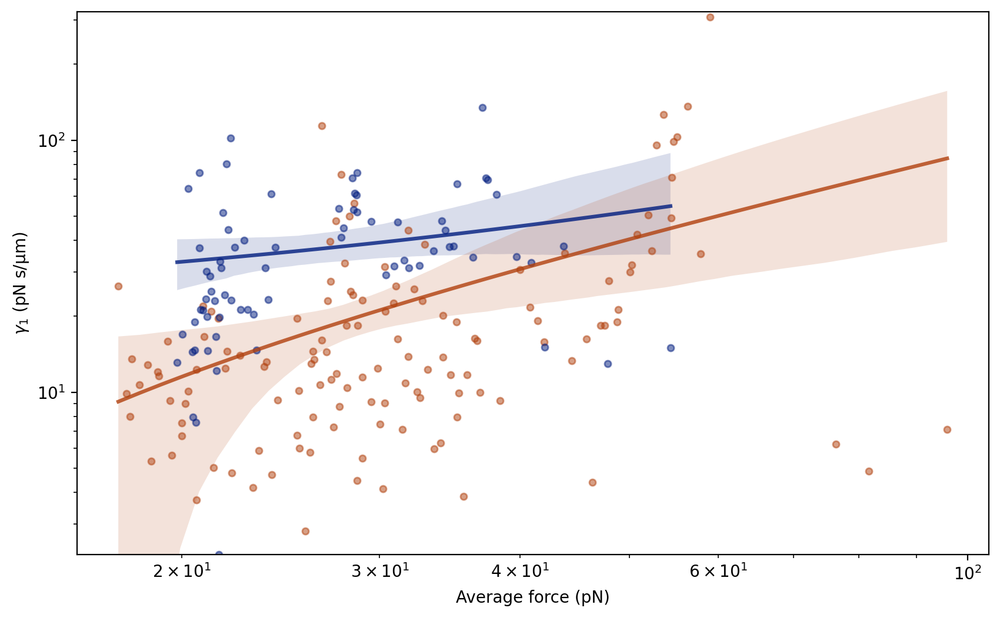

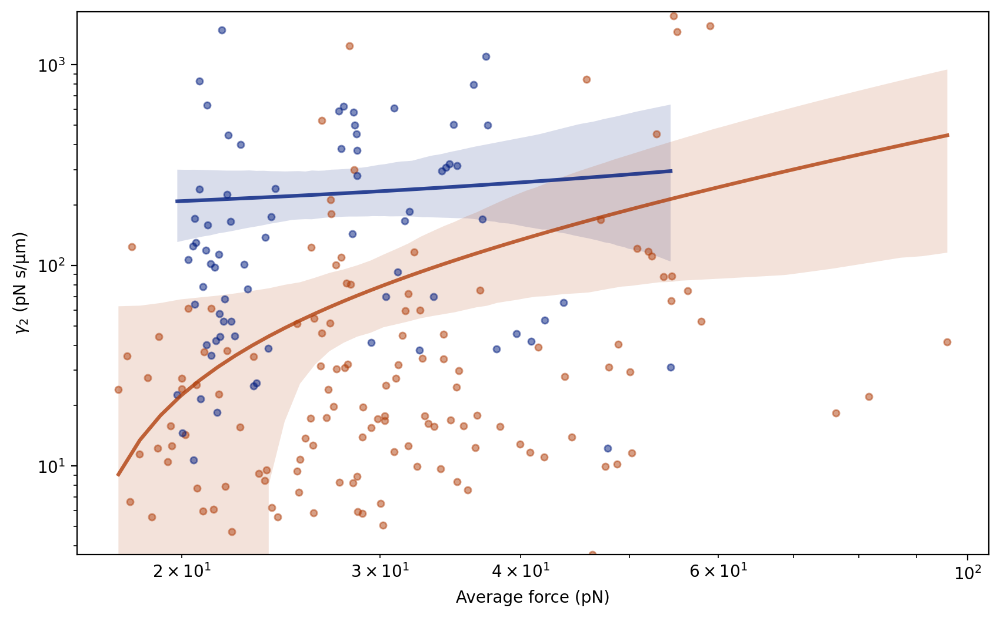

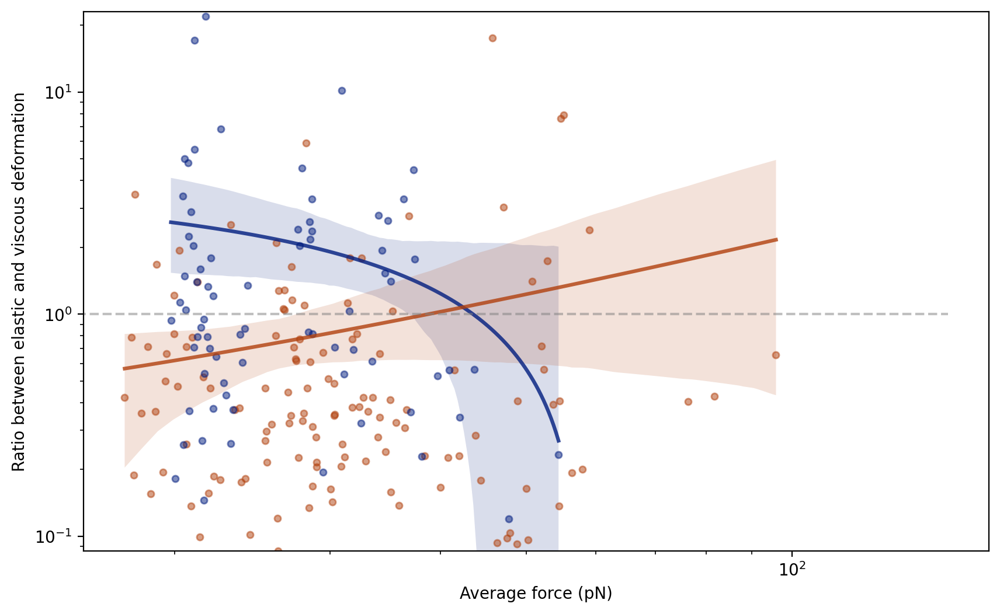

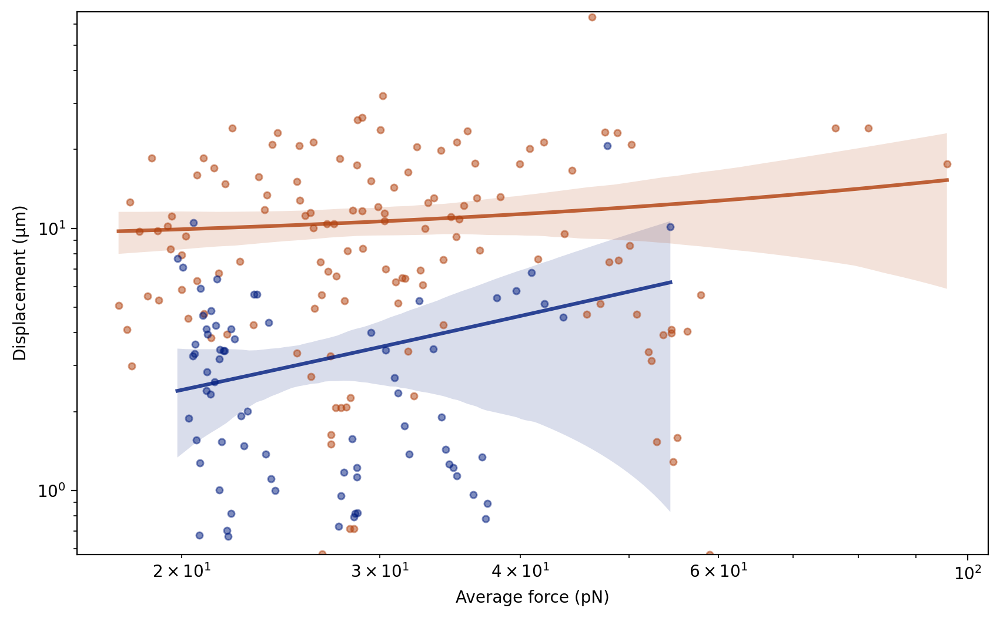

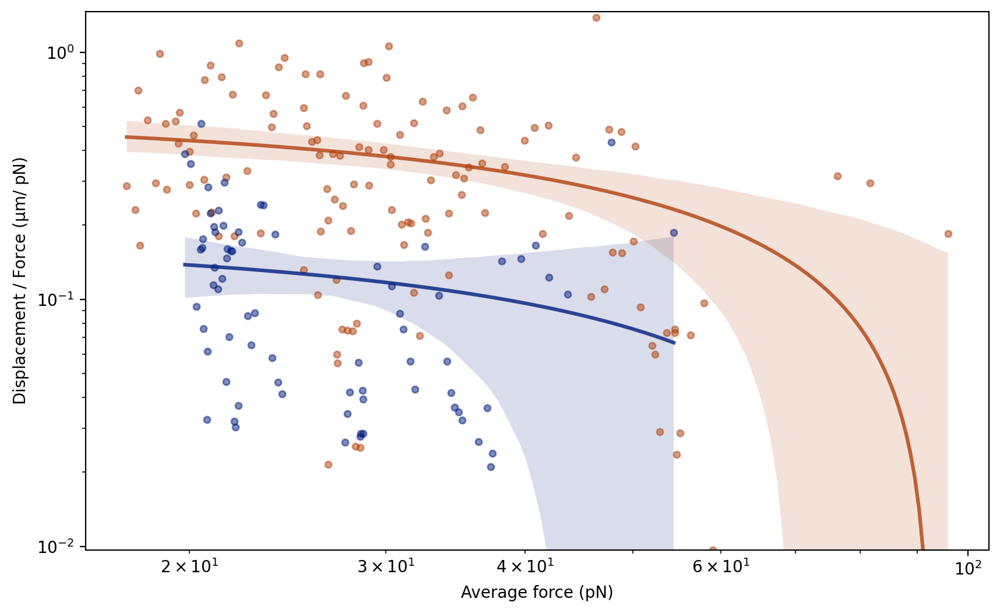

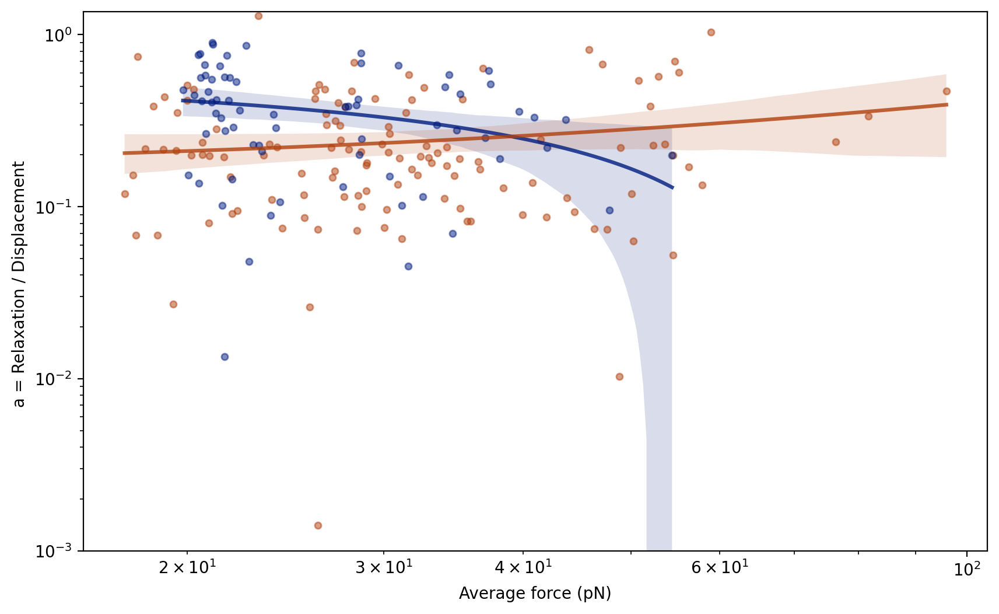

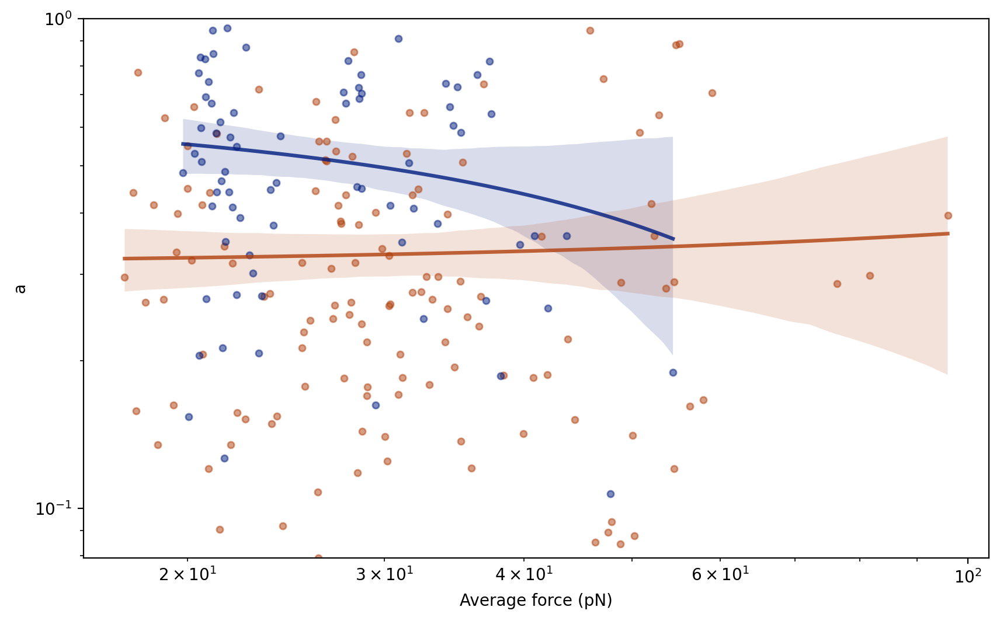

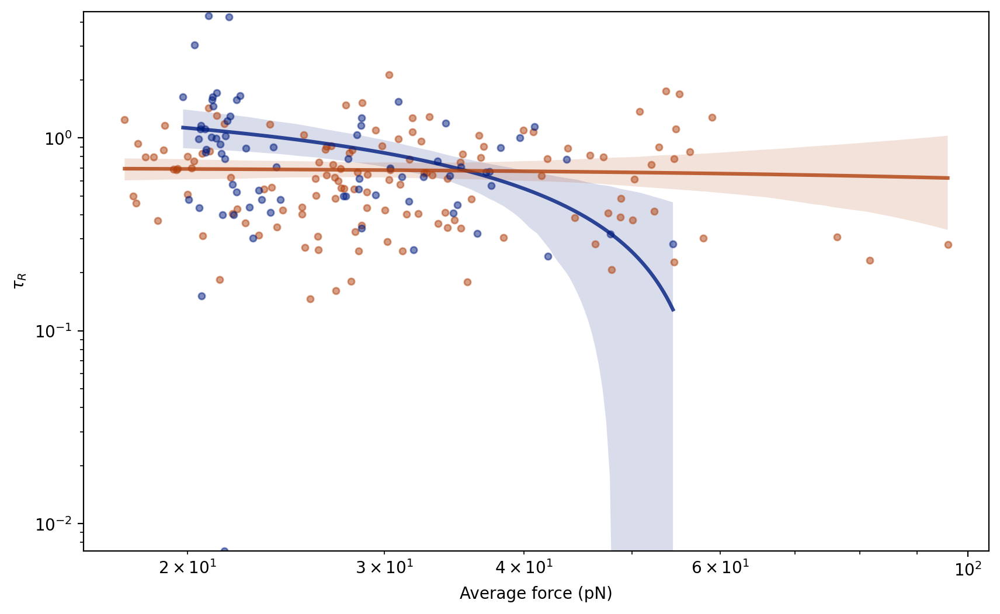

In [72]:
df_results_filtered = df_results_filtered.sort_values(by='AVG_FORCE', ascending=True)

for (param, label) in zip(params, labels):
    fig = plt.figure(figsize=(10, 6), dpi=200)
    # plot perturb data
    plt.plot(df_results_filtered.loc[(df_results_filtered['MT_STATUS']=='noco'), 'AVG_FORCE'], df_results_filtered.loc[(df_results_filtered['MT_STATUS']=='noco'), param], 'o', color=sns.color_palette()[3], alpha=0.5, markersize = 4, label=embryo)
    plt.plot(df_results_filtered.loc[(df_results_filtered['MT_STATUS']=='taxol'), 'AVG_FORCE'], df_results_filtered.loc[(df_results_filtered['MT_STATUS']=='taxol'), param], 'o', color=sns.color_palette()[1], alpha=0.5, markersize = 4, label=embryo)
    
    sns.regplot(data=df_results_filtered[(df_results_filtered['MT_STATUS']=='taxol')], x='AVG_FORCE', y=param, ci=95, robust=False, marker='', line_kws=dict(color=sns.color_palette()[1], alpha=0.8))

    sns.regplot(data=df_results_filtered[(df_results_filtered['MT_STATUS']=='noco')], x='AVG_FORCE', y=param, ci=95, robust=False, marker='', line_kws=dict(color=sns.color_palette()[3], alpha=0.8))

    if param =='elastic_viscous_ratio':
        plt.hlines(1, 0, 150, color='gray', linestyle='--', alpha=0.5)
    
    plt.xlabel('Average force (pN)')
    plt.ylabel(label)
    # plt.legend()
    plt.ylim(bottom=max(df_results_filtered[param].min(), 0.001))
    # plt.xlim(left=0)
    # plt.ylim(bottom=0)
    plt.xscale('log')
    plt.yscale('log')
    plt.show()

# Individual curves averaged and binned by force

In [73]:
folder = '/Volumes/cytokinesis-zebrafish-collab/magnetic_tweezers_nocodazole/2_analysis/measurements_extended_info/'

df_perturb_tracks = pd.DataFrame()
for file in os.listdir(folder):
    if file.endswith('.h5'):
        # Read the data using pandas
        df = pd.read_hdf(folder+file)
        df['file'] = file
        df['EXPERIMENT'] = file[:18].replace('_', '')
        df['EMBRYO'] = file[:15].replace('_', '')
        df_perturb_tracks = pd.concat([df_perturb_tracks, df])

df_perturb_tracks.dropna(subset=[displacement_column], inplace=True)

print(df_perturb_tracks.columns)

Index(['LABEL', 'ID', 'TRACK_ID', 'QUALITY', 'POSITION_X', 'POSITION_Y',
       'POSITION_Z', 'POSITION_T', 'FRAME', 'RADIUS', 'VISIBILITY',
       'MANUAL_SPOT_COLOR', 'MEAN_INTENSITY_CH1', 'MEDIAN_INTENSITY_CH1',
       'MIN_INTENSITY_CH1', 'MAX_INTENSITY_CH1', 'TOTAL_INTENSITY_CH1',
       'STD_INTENSITY_CH1', 'CONTRAST_CH1', 'SNR_CH1', 'DISTANCE [um]',
       'MAGNET_STATUS', 'PULSE_NUMBER', 'FORCE [pN]', 'MT_STATUS',
       'DISPLACEMENT [um]', 'CORRECTION_k', 'CORRECTION_k_ERR', 'CORRECTION_N',
       'CORRECTION_N_ERR', 'CORRECTED DISPLACEMENT [um]', 'file', 'EXPERIMENT',
       'EMBRYO'],
      dtype='object')


In [74]:
df_perturb_tracks['USABLE'] = np.zeros(len(df_perturb_tracks))
for measurement in df_results_filtered[['EXPERIMENT', 'TRACK_ID', 'PULSE_NUMBER']].values:
    embryo, track, pulse = measurement
    
    df = df_perturb_tracks.loc[(df_perturb_tracks['EXPERIMENT']==embryo)&(df_perturb_tracks['TRACK_ID']==track)&(df_perturb_tracks['PULSE_NUMBER']==pulse)]

    df_perturb_tracks.loc[(df_perturb_tracks['EXPERIMENT']==embryo)&(df_perturb_tracks['TRACK_ID']==track)&(df_perturb_tracks['PULSE_NUMBER']==pulse), 'NORMALIZED_TIME'] = (df['FRAME']-np.min(df['FRAME'])) * dt
    
    df_perturb_tracks.loc[(df_perturb_tracks['EXPERIMENT']==embryo)&(df_perturb_tracks['TRACK_ID']==track)&(df_perturb_tracks['PULSE_NUMBER']==pulse), 'AVG_FORCE'] = df_results_filtered.loc[(df_results_filtered['EXPERIMENT']==embryo)&(df_results_filtered['TRACK_ID']==track)&(df_results_filtered['PULSE_NUMBER']==pulse), 'AVG_FORCE'].values[0]

    df_perturb_tracks.loc[(df_perturb_tracks['EXPERIMENT']==embryo)&(df_perturb_tracks['TRACK_ID']==track)&(df_perturb_tracks['PULSE_NUMBER']==pulse), 'USABLE'] = 1

    if len(df['POSITION_T'])>50:
        plt.plot(df['POSITION_T']-np.min(df['POSITION_T']), df[displacement_column], 'o', color=sns.color_palette()[0], alpha=0.5, markersize = 4)
        plt.show()
        print(embryo, track, pulse) 

print(len(df_perturb_tracks[df_perturb_tracks['USABLE'] == 1])/len(df_perturb_tracks))

0.34236114009097357


# Histograms of binned force data

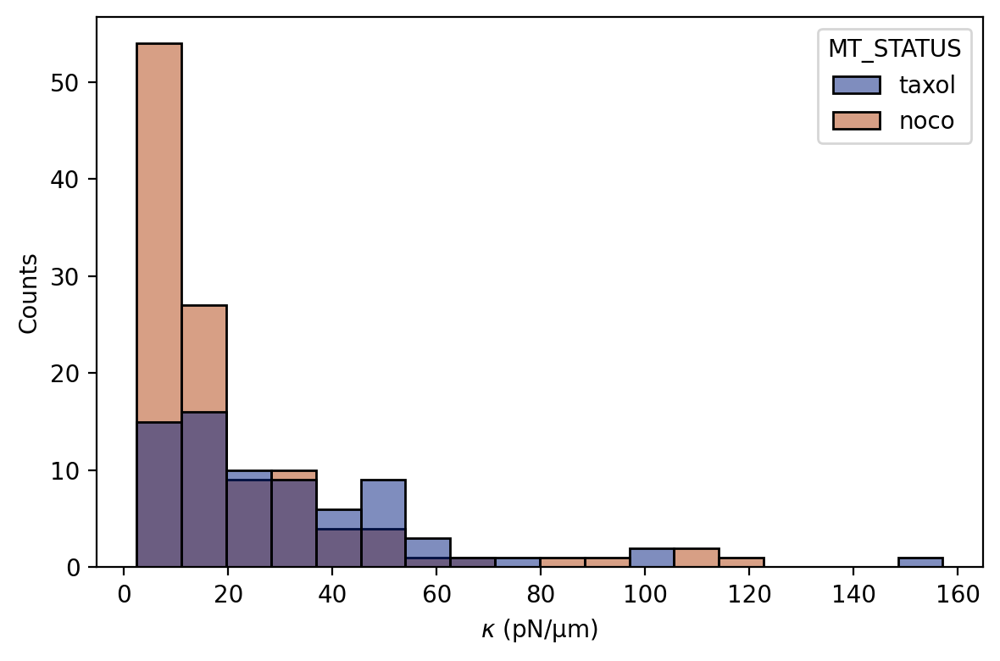

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_53945/470872860.py:15: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)
/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_53945/470872860.py:21: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)


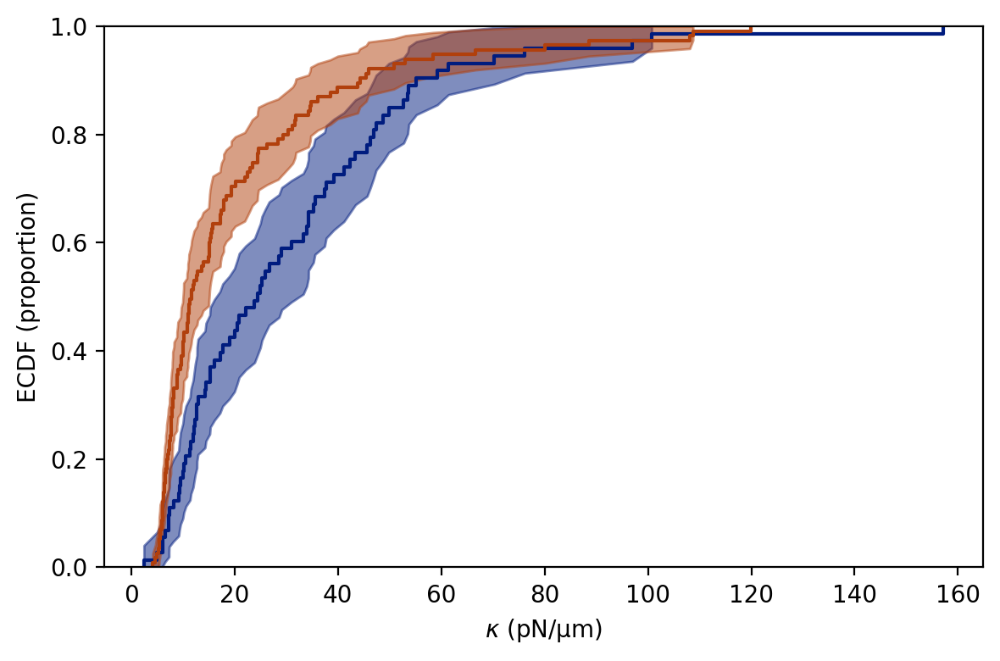

MannwhitneyuResult(statistic=np.float64(2748.0), pvalue=np.float64(6.75076915921026e-05))


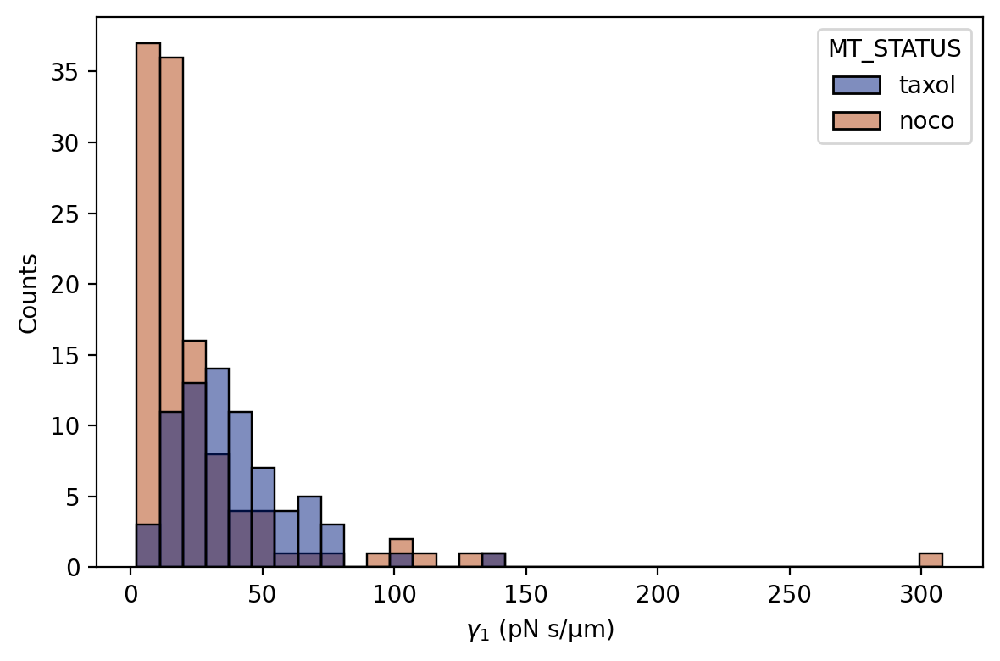

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_53945/470872860.py:15: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)
/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_53945/470872860.py:21: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)


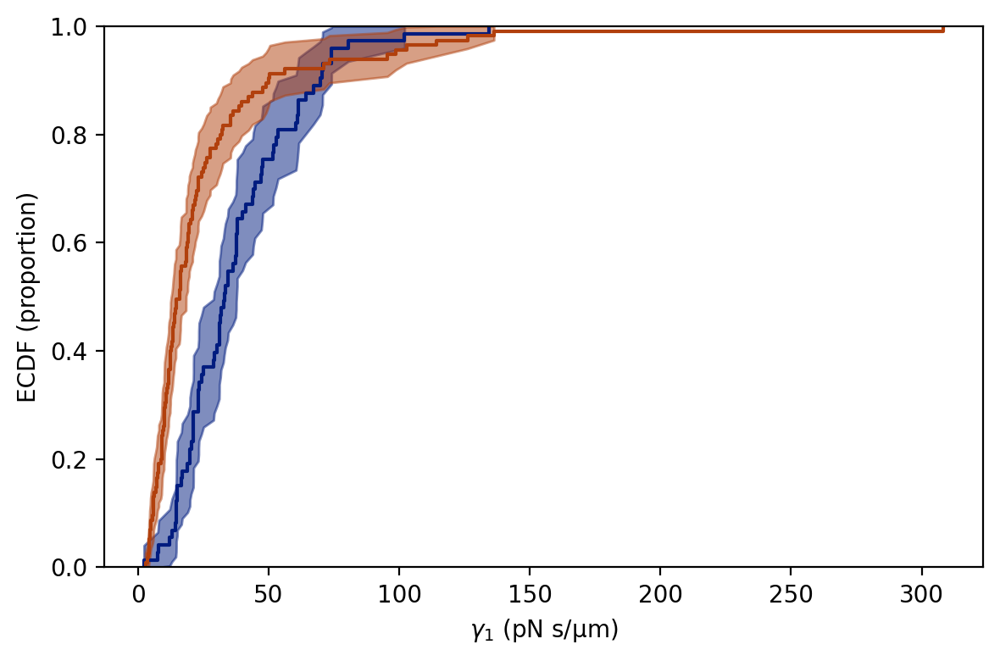

MannwhitneyuResult(statistic=np.float64(2107.0), pvalue=np.float64(9.04544879193781e-09))


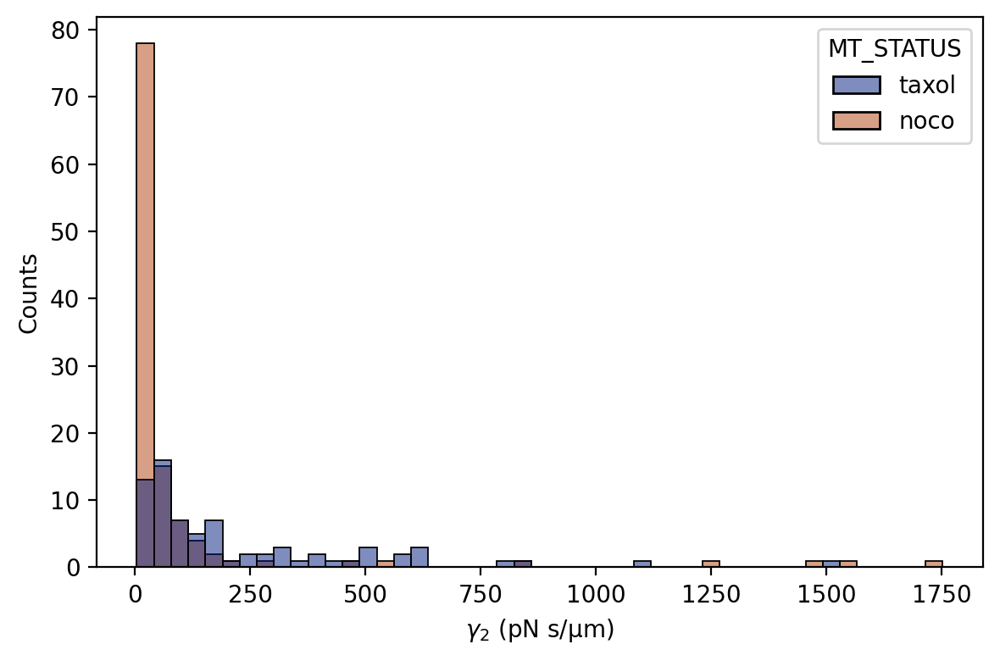

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_53945/470872860.py:15: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)
/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_53945/470872860.py:21: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)


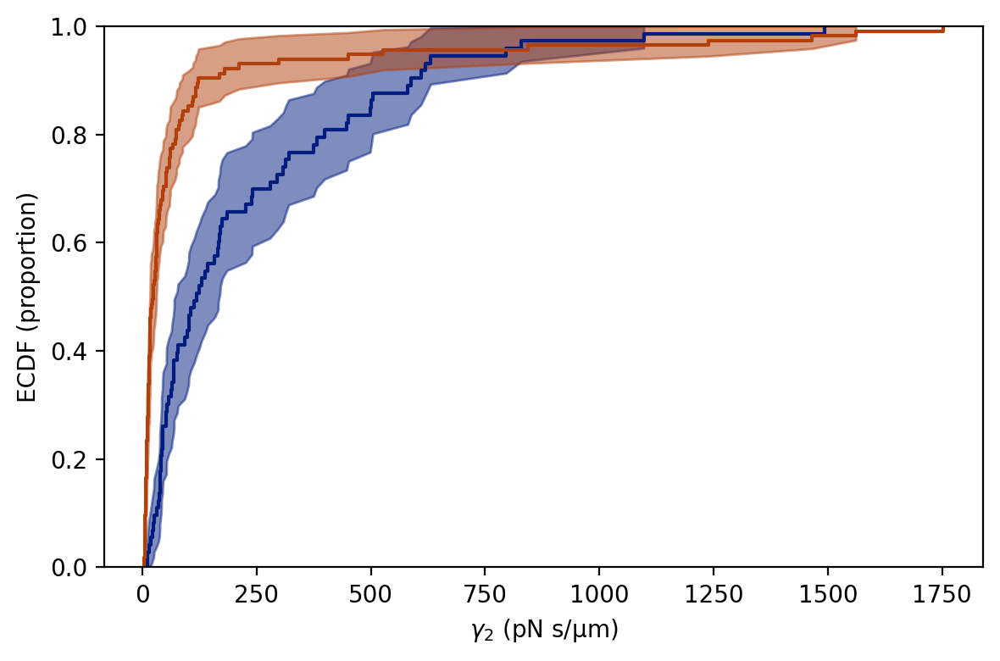

MannwhitneyuResult(statistic=np.float64(1619.0), pvalue=np.float64(1.3433289555906998e-12))


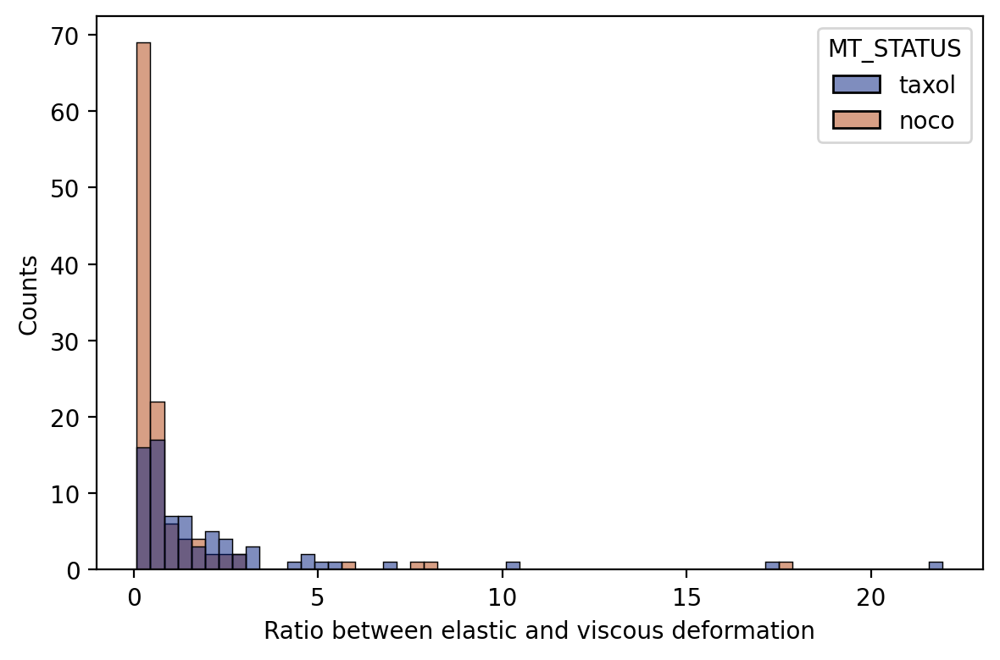

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_53945/470872860.py:15: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)
/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_53945/470872860.py:21: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)


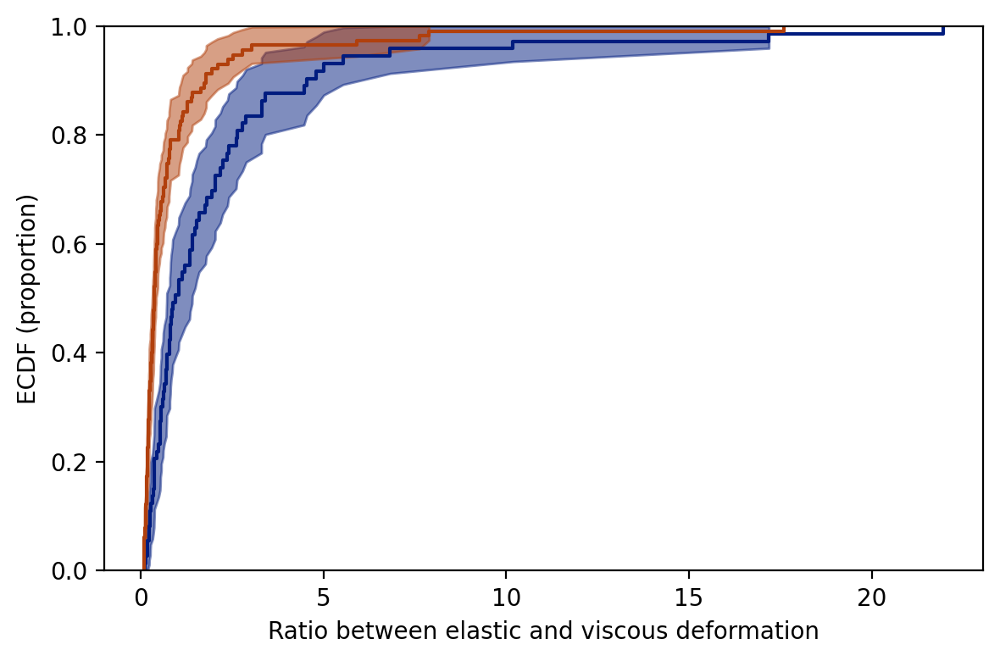

MannwhitneyuResult(statistic=np.float64(2171.0), pvalue=np.float64(2.522453438974898e-08))


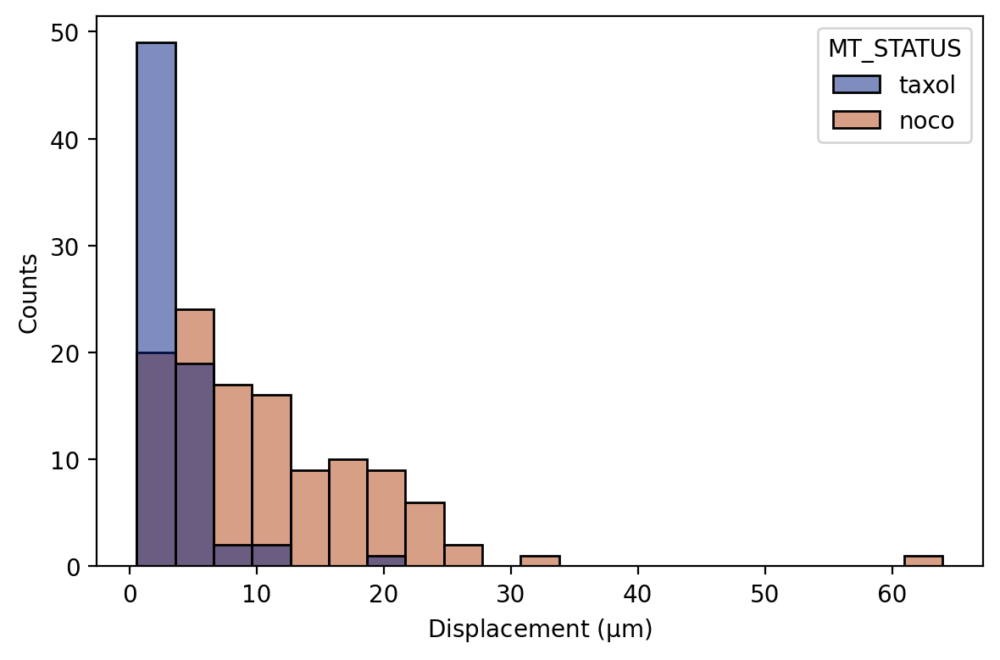

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_53945/470872860.py:15: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)
/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_53945/470872860.py:21: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)


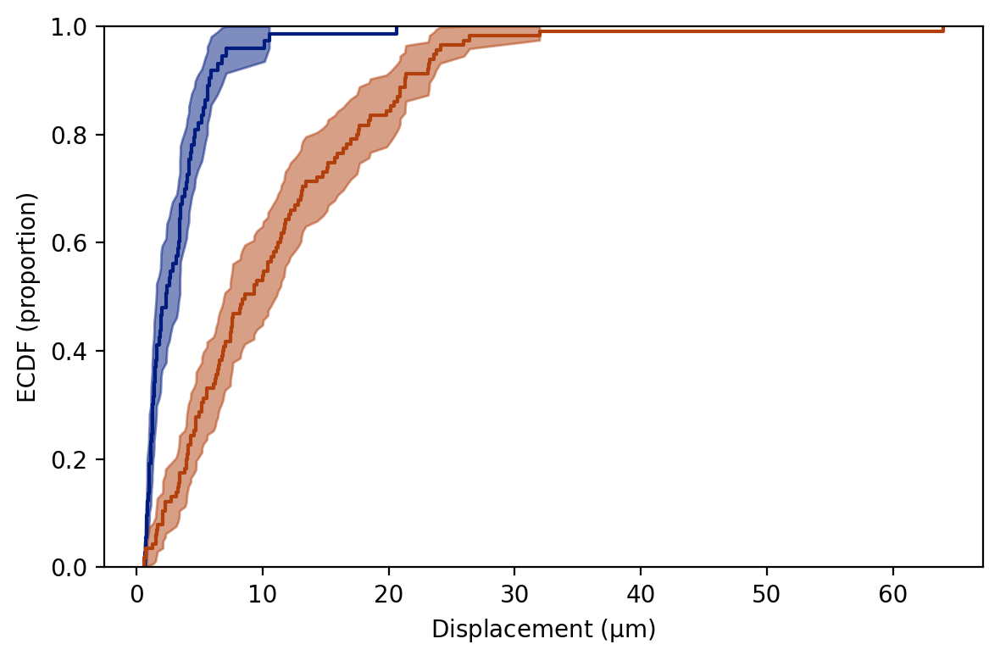

MannwhitneyuResult(statistic=np.float64(7088.0), pvalue=np.float64(1.8984487964177307e-15))


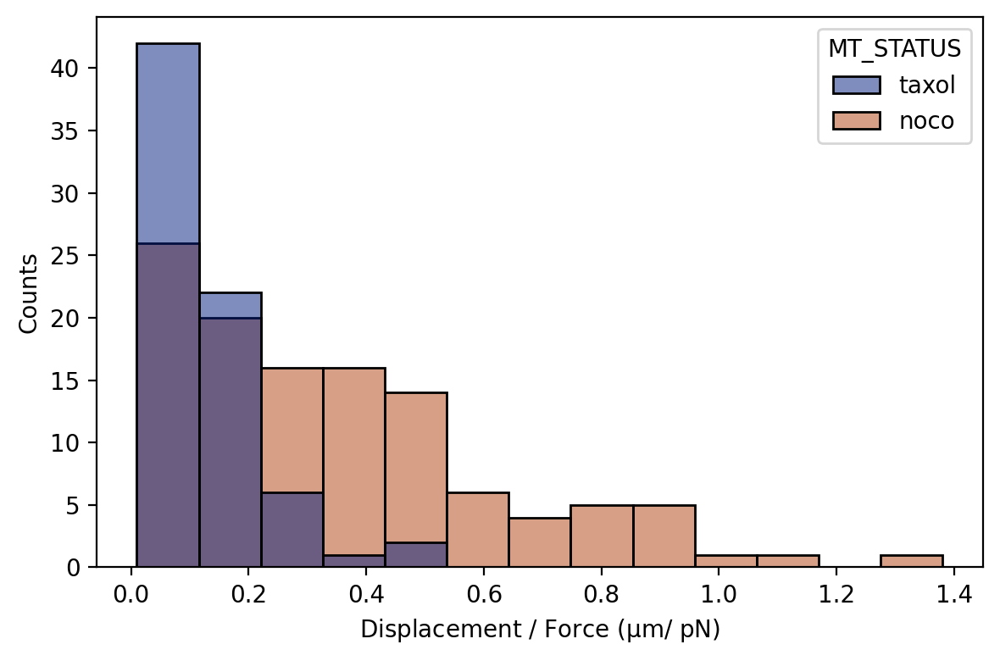

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_53945/470872860.py:15: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)
/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_53945/470872860.py:21: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)


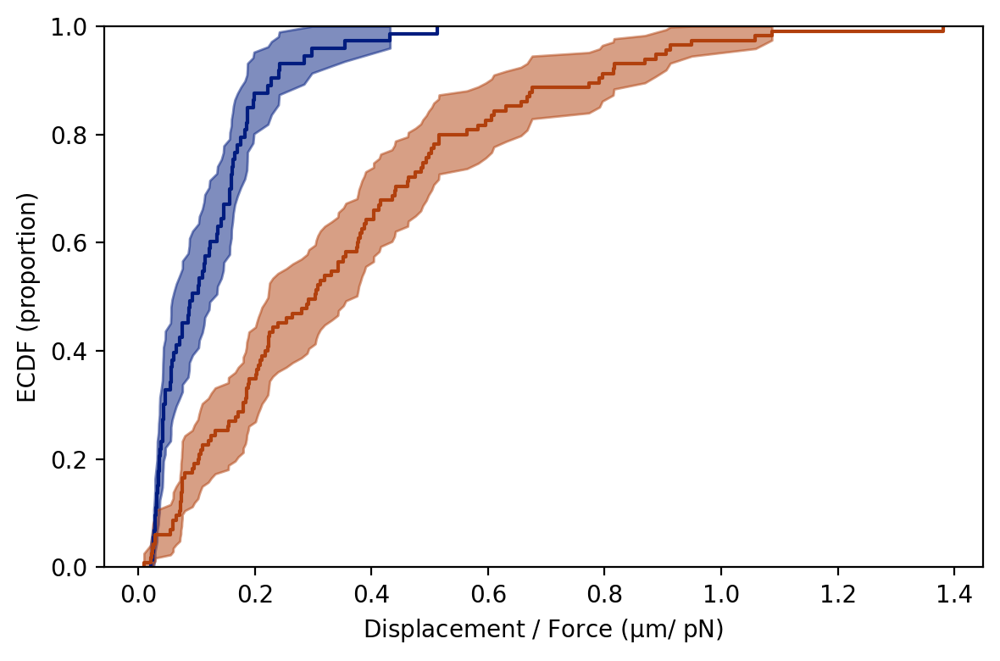

MannwhitneyuResult(statistic=np.float64(6682.0), pvalue=np.float64(8.417066017379584e-12))


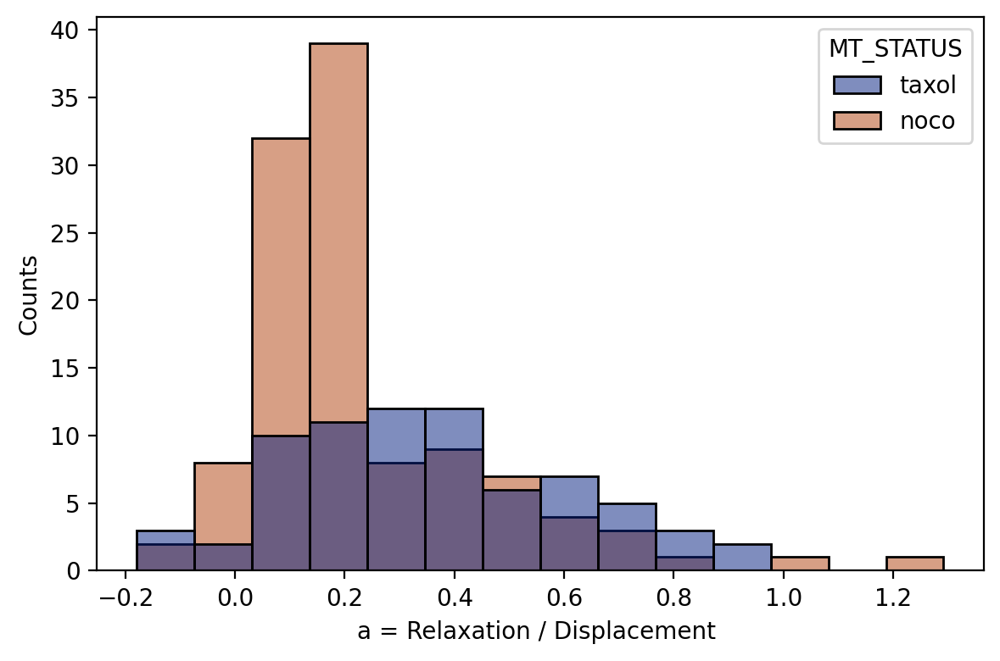

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_53945/470872860.py:15: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)
/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_53945/470872860.py:21: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)


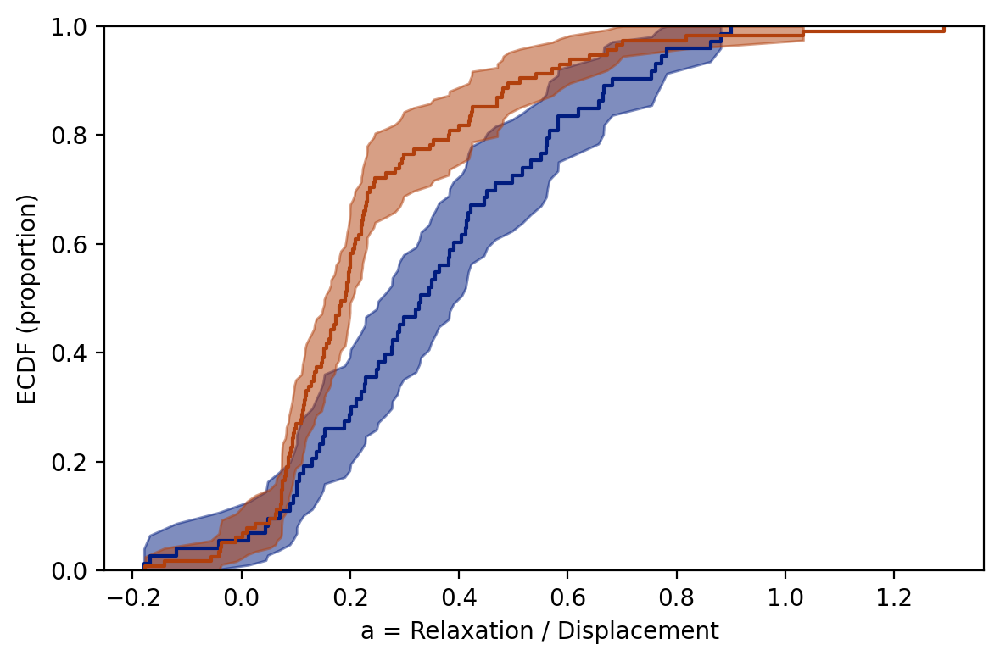

MannwhitneyuResult(statistic=np.float64(2848.0), pvalue=np.float64(0.0002073473062534225))


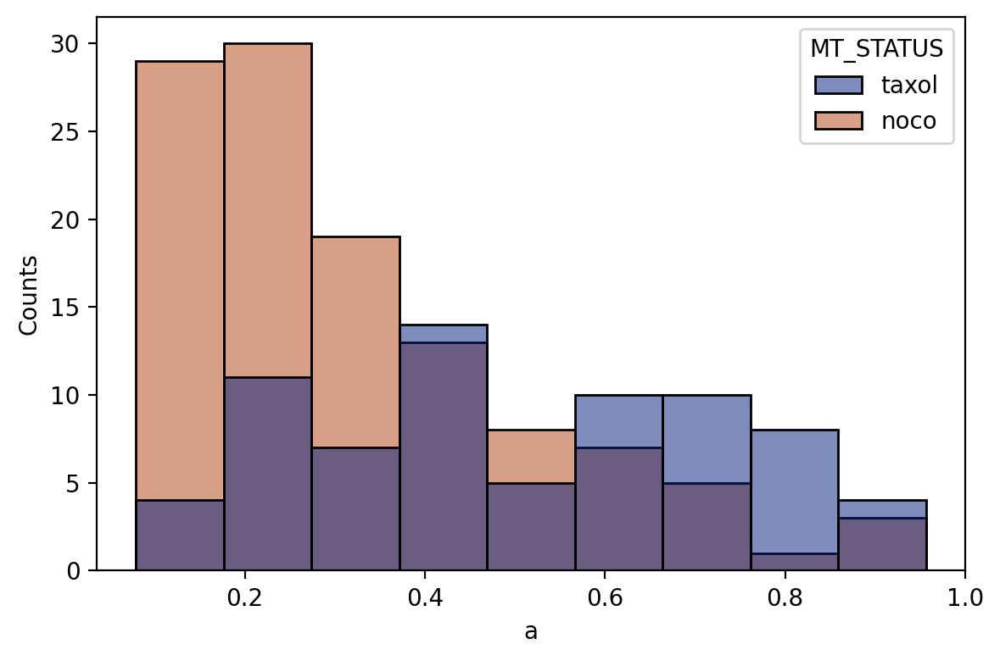

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_53945/470872860.py:15: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)
/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_53945/470872860.py:21: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)


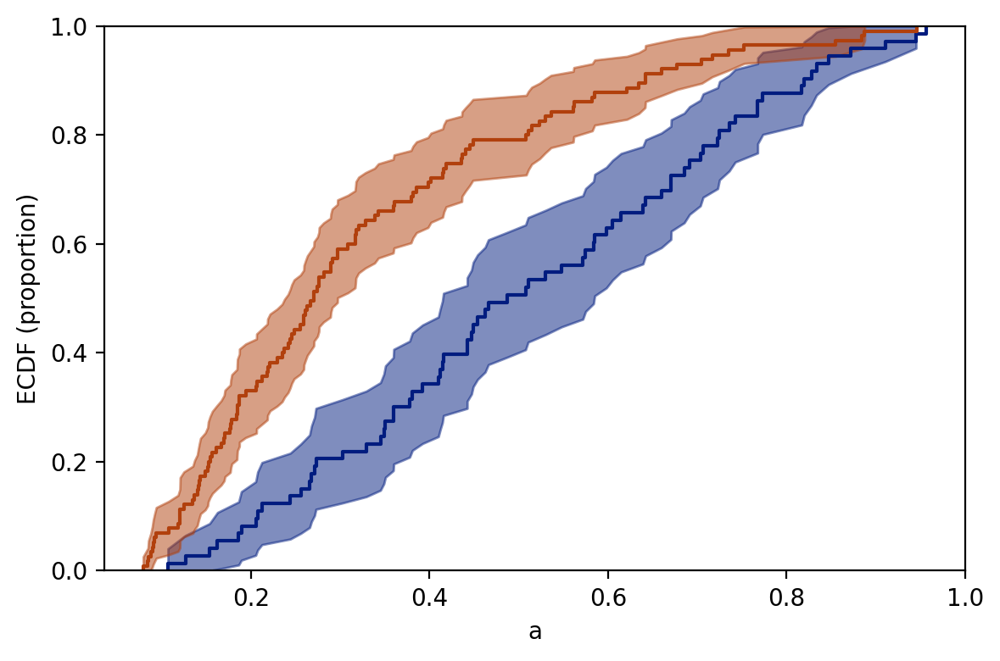

MannwhitneyuResult(statistic=np.float64(2171.0), pvalue=np.float64(2.522453438974898e-08))


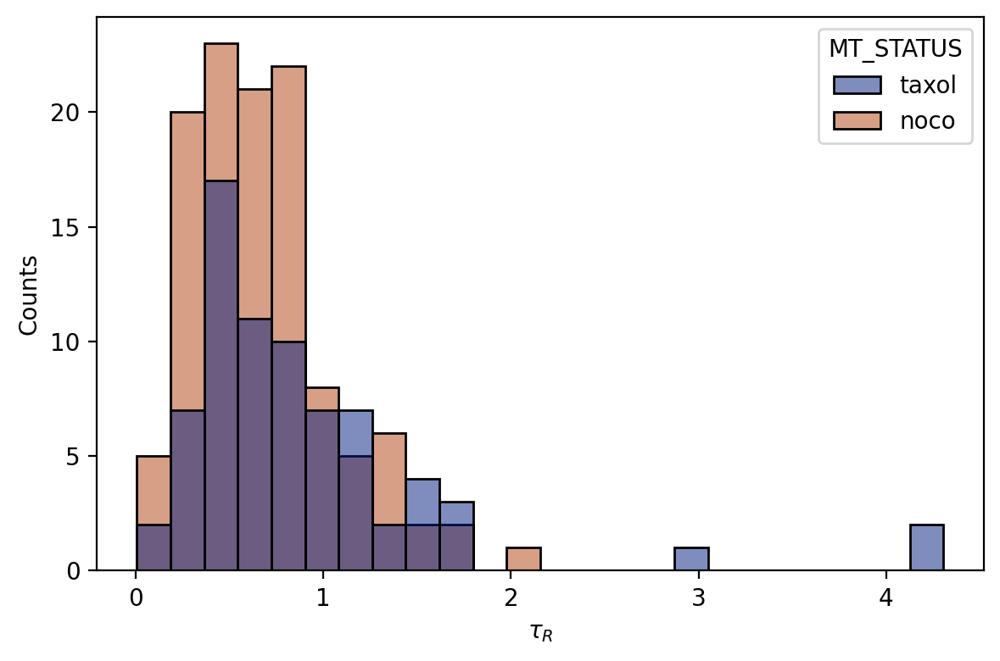

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_53945/470872860.py:15: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)
/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_53945/470872860.py:21: RuntimeWarning: The confidence interval is undefined at some observations. This is a feature of the mathematical formula used, not an error in its implementation.
  ci = res.cdf.confidence_interval(confidence_level=0.95)


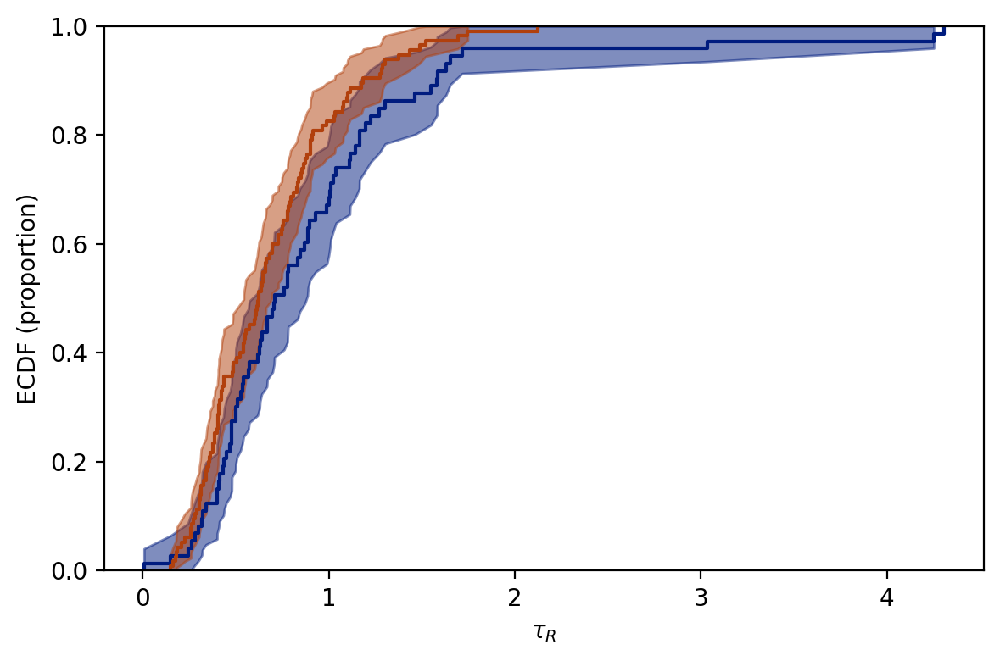

MannwhitneyuResult(statistic=np.float64(3406.0), pvalue=np.float64(0.02960513154405671))


In [75]:


for (param, label) in zip(params, labels):
    fig = plt.figure(figsize=(6, 4), dpi=200)
    df_binned_force = df_results_filtered[(df_results_filtered['AVG_FORCE']>force_range[0])&(df_results_filtered['AVG_FORCE']<force_range[1])]
    sns.histplot(df_binned_force, x=param, hue='MT_STATUS', palette=darker_colors)
    plt.xlabel(label)
    plt.ylabel('Counts')
    plt.tight_layout()
    plt.savefig(f'{dir_plots}/results/auxiliary_plots_statistics/result_histogram_{param}.svg', format='svg')
    plt.show()

    fig = plt.figure(figsize=(6, 4), dpi=200)
    res = ecdf(df_binned_force.loc[df_binned_force['MT_STATUS']=='taxol', param].values)
    ecdf_data_x = df_binned_force.sort_values(by=param, ascending=True).loc[df_binned_force['MT_STATUS']=='taxol', param]
    sns.ecdfplot(x=res.cdf.quantiles, color=sns.color_palette()[1])
    ci = res.cdf.confidence_interval(confidence_level=0.95)
    plt.fill_between(res.cdf.quantiles, ci.low.probabilities, ci.high.probabilities, color=sns.color_palette()[1], alpha=0.5)

    res = ecdf(df_binned_force.loc[df_binned_force['MT_STATUS']=='noco', param].values)
    ecdf_data_x = df_binned_force.sort_values(by=param, ascending=True).loc[df_binned_force['MT_STATUS']=='noco', param]
    sns.ecdfplot(x=res.cdf.quantiles, color=sns.color_palette()[3])
    ci = res.cdf.confidence_interval(confidence_level=0.95)
    plt.fill_between(res.cdf.quantiles, ci.low.probabilities, ci.high.probabilities, color=sns.color_palette()[3], alpha=0.5)

    plt.ylabel('ECDF (proportion)')
    plt.xlabel(label)
    plt.tight_layout()
    plt.savefig(f'{dir_plots}/results/auxiliary_plots_statistics/result_ecdf_{param}.svg', format='svg')
    plt.show()

    res = mannwhitneyu(df_binned_force.loc[df_binned_force['MT_STATUS']=='noco', param].values, 
                    df_binned_force.loc[df_binned_force['MT_STATUS']=='taxol', param].values)

    print(res)

# Confidence intervals and p values of parameters

In [76]:
df_data_stats = df_results_filtered.groupby(['EMBRYO', 'MT_STATUS']).median(numeric_only=True).reset_index()
df_data_stats['group_size'] = df_results_filtered.groupby(['EMBRYO', 'MT_STATUS']).size().values

df_data_stats_from_curves = pd.read_csv('/Volumes/cytokinesis-zebrafish-collab/magnetic_tweezers_nocodazole/3_plots/results/results_displacement_curve_averaged_force_range20-60pN_no_subtr_bck.csv')

df_params_stats = pd.DataFrame()
p_values = dict()


for param in params:
    df_binned_force = df_data_stats[(df_data_stats['AVG_FORCE']>force_range[0])&(df_data_stats['AVG_FORCE']<force_range[1])]

    for mt_status in ['taxol', 'noco']:

        weights=df_binned_force.loc[df_binned_force['MT_STATUS']==mt_status, 'group_size'].values
        weighted_average, ci = weighted_bootstrap(df_binned_force.loc[df_binned_force['MT_STATUS']==mt_status, param].values, weights=weights, rng=rng)
        weighted_average_from_curves, ci_from_curves = weighted_bootstrap(df_binned_force.loc[df_binned_force['MT_STATUS']==mt_status, param].values, weights=weights, rng=rng)

        new_line = {'parameter': param, 
                    'weighted_average': weighted_average,
                    'conf_int_low': ci[0], 
                    'conf_int_high': ci[1],
                    'y_err_low': weighted_average - ci[0],
                    'y_err_high': ci[1] - weighted_average,
                    'MT_STATUS': mt_status
                    }
        df_params_stats = pd.concat([df_params_stats, pd.DataFrame(new_line, index=[0])])

    res = ttest_ind(df_binned_force.loc[df_binned_force['MT_STATUS']=='noco', param].values, 
                    df_binned_force.loc[df_binned_force['MT_STATUS']=='taxol', param].values, equal_var=False)
    
    p_values[param] = res.pvalue


df_params_stats.to_csv(f'{dir_plots}/results/results_material_properies_stats.csv', index=False)

In [77]:
df_results_from_average_curves = pd.read_csv(f'{dir_plots}/results/results_parameters_curve_averaged_force_range{force_ranges[0][0]}-{force_ranges[0][1]}pN_{subtr_bck_label}{creep_only_label}.csv')
df_results_from_average_curves['group_size'] = df_results_from_average_curves .groupby(['EMBRYO', 'MT_STATUS']).size().values
df_results_from_average_curves.sort_values(by=['MT_STATUS'], ascending=False, inplace=True)

df_params_avg_curves_stats = pd.DataFrame()

p_values_avg_curves = dict()

for param in params:
    if param in df_results_from_average_curves.columns:

        for mt_status in ['taxol', 'noco']:

            weights=df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']==mt_status, 'group_size'].values

            weighted_average, ci = weighted_bootstrap(df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']==mt_status, param].values, weights=weights, rng=rng)

            new_line = {'parameter': param, 
                        'weighted_average': weighted_average,
                        'conf_int_low': ci[0], 
                        'conf_int_high': ci[1],
                        'y_err_low': weighted_average - ci[0],
                        'y_err_high': ci[1] - weighted_average,
                        'MT_STATUS': mt_status
                        }
            df_params_avg_curves_stats = pd.concat([df_params_avg_curves_stats, pd.DataFrame(new_line, index=[0])])

        res = ttest_ind(
            df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']=='noco', param].values, 
            df_results_from_average_curves.loc[df_results_from_average_curves['MT_STATUS']=='taxol', param].values, equal_var=False)
    
        p_values_avg_curves[param] = res.pvalue

df_params_avg_curves_stats.to_csv(f'{dir_plots}/results/results_material_properies_avg_curves_stats_{subtr_bck_label}.csv', index=False)
print('P-values for the parameters from the averaged curves:', p_values_avg_curves)

P-values for the parameters from the averaged curves: {'k': np.float64(0.23262273951598897), 'eta_1': np.float64(0.0727268212653686), 'eta_2': np.float64(0.035773934703930275), 'elastic_viscous_ratio': np.float64(0.2972322466788051), 'rising_dif': np.float64(0.010741635762640407), 'rising_dif_norm': np.float64(0.009548323147645432), 'relative_dif': np.float64(0.47556025273783786), 'a': np.float64(0.23253571961857453), 'tau_r': np.float64(0.6113385589794602)}


In [78]:
df_data_stats = df_data_stats.sort_values(by='MT_STATUS', ascending=False)
df_data_stats

,EMBRYO,MT_STATUS,Unnamed: 0,TRACK_ID,PULSE_NUMBER,AVG_FORCE,k,eta_1,eta_2,k_err,...,relax_too_much,rising_dif,relaxing_dif,rising_dif_norm,rising_dif_norm_inverse,relative_dif,tau_r,a,elastic_viscous_ratio,group_size
2,20250507s01p01,taxol,212.0,2.0,7.0,21.087497,11.386833,21.229349,63.833652,0.842984,...,0.0,3.458528,-1.505406,0.161845,6.178769,0.467201,1.024249,0.530194,1.128538,31
3,20250507s01p02,taxol,111.5,1.0,5.5,22.808321,44.526416,38.834064,151.919768,4.876596,...,0.0,1.056455,-0.114731,0.046346,21.577335,0.125734,0.459072,0.370519,0.595526,10
4,20250507s01p03,taxol,179.0,0.0,6.0,33.477772,34.318372,43.906997,279.621287,2.400613,...,0.0,1.437539,-0.514125,0.043199,23.148716,0.277489,0.630774,0.507564,1.030722,33
0,20240808s03p01,noco,383.5,0.0,1.5,88.755590,11.572358,5.987270,31.981350,0.767397,...,0.0,20.878872,-8.185559,0.239718,4.410254,0.402400,0.256376,0.347637,0.541515,2
1,20240808s03p02,noco,60.0,0.0,3.0,32.383698,6.052702,9.297501,15.559297,0.492338,...,0.0,19.821785,-4.169045,0.515178,1.941077,0.239128,0.827960,0.287211,0.402939,11
5,20250507s02p01,noco,339.5,0.5,5.0,26.431893,10.705288,15.318435,30.663003,0.822264,...,0.0,5.544164,-1.547263,0.234659,4.263376,0.216638,0.712113,0.315301,0.461545,28
6,20250507s02p02,noco,377.0,0.0,5.0,20.934436,8.292590,14.521238,25.376181,0.753187,...,0.0,6.292876,-1.079572,0.305211,3.276420,0.197587,0.832125,0.342647,0.521253,9
7,20250507s03p01,noco,72.0,3.0,5.0,24.052229,6.106055,5.631061,16.886760,0.493639,...,0.0,11.425378,-3.762300,0.441114,2.266988,0.351207,0.605455,0.398997,0.663884,11
8,20250507s03p02,noco,12.5,1.0,6.0,35.116540,13.163814,12.830305,10.491027,1.581437,...,0.0,13.298009,-1.524659,0.481902,2.075468,0.096861,0.440170,0.145413,0.170173,24
9,20250507s03p03,noco,90.0,2.0,6.0,33.517213,15.595889,20.148646,31.894909,1.921631,...,0.0,7.006048,-1.505610,0.205986,4.854701,0.182612,0.615691,0.270578,0.370948,47


/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_53945/2389244665.py:12: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('dark'), zorder=1)


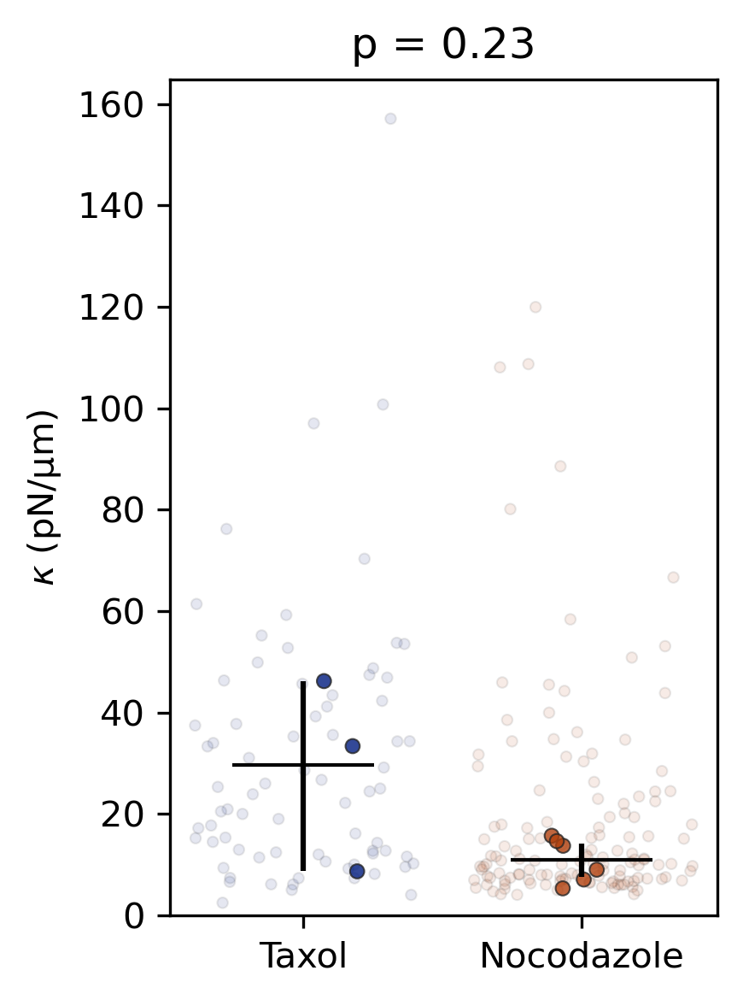

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_53945/2389244665.py:12: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('dark'), zorder=1)


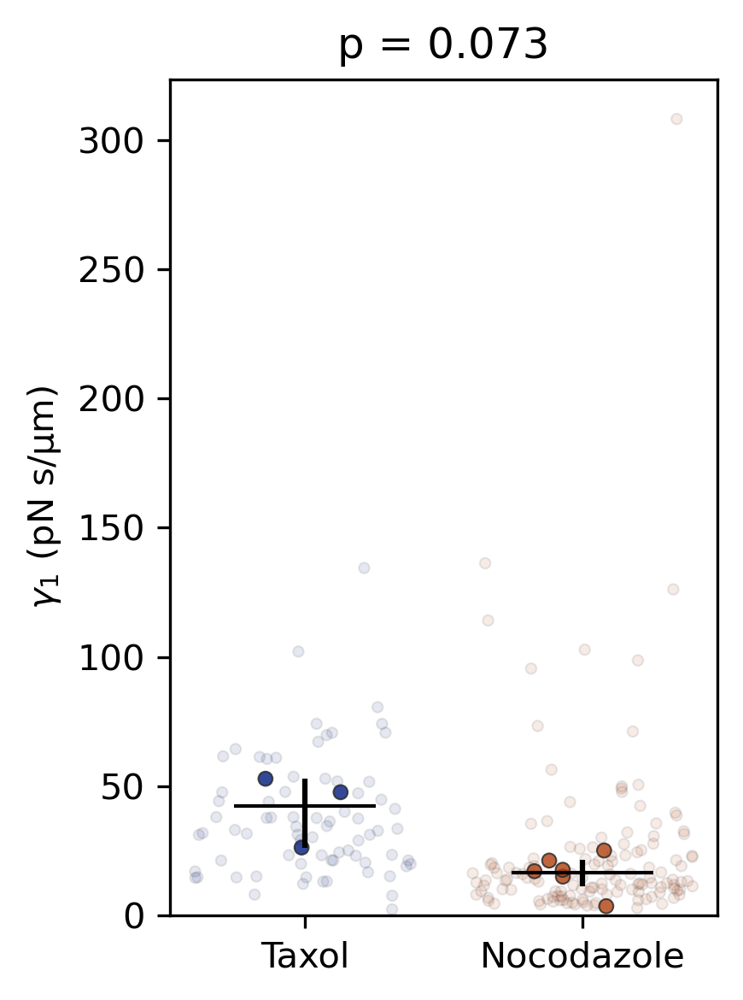

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_53945/2389244665.py:12: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('dark'), zorder=1)


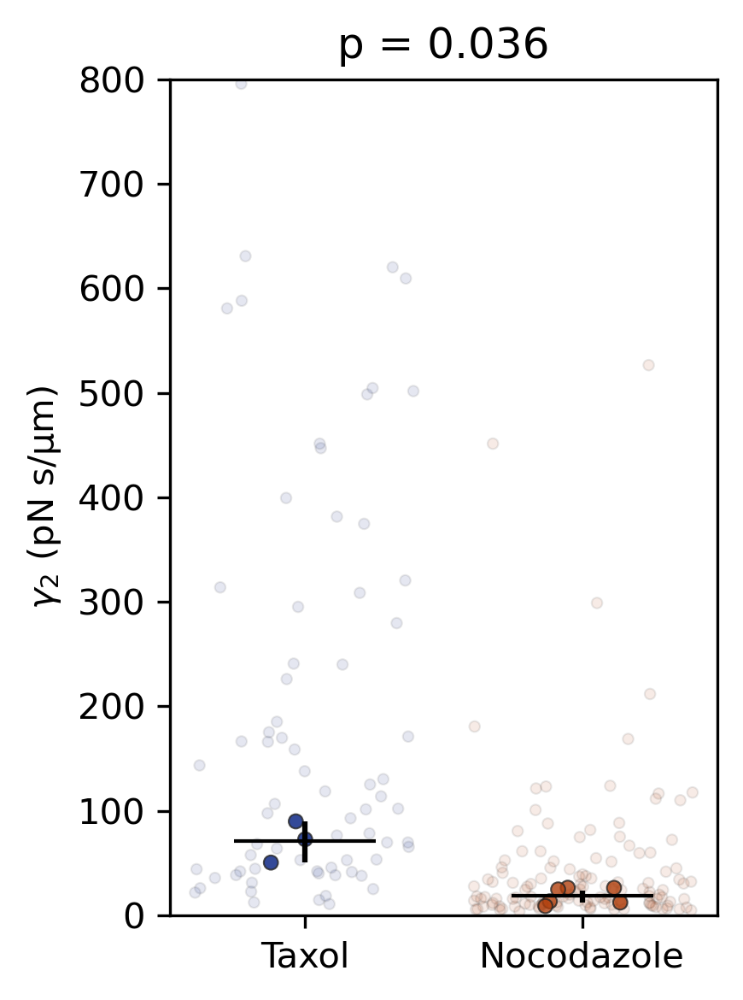

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_53945/2389244665.py:12: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('dark'), zorder=1)


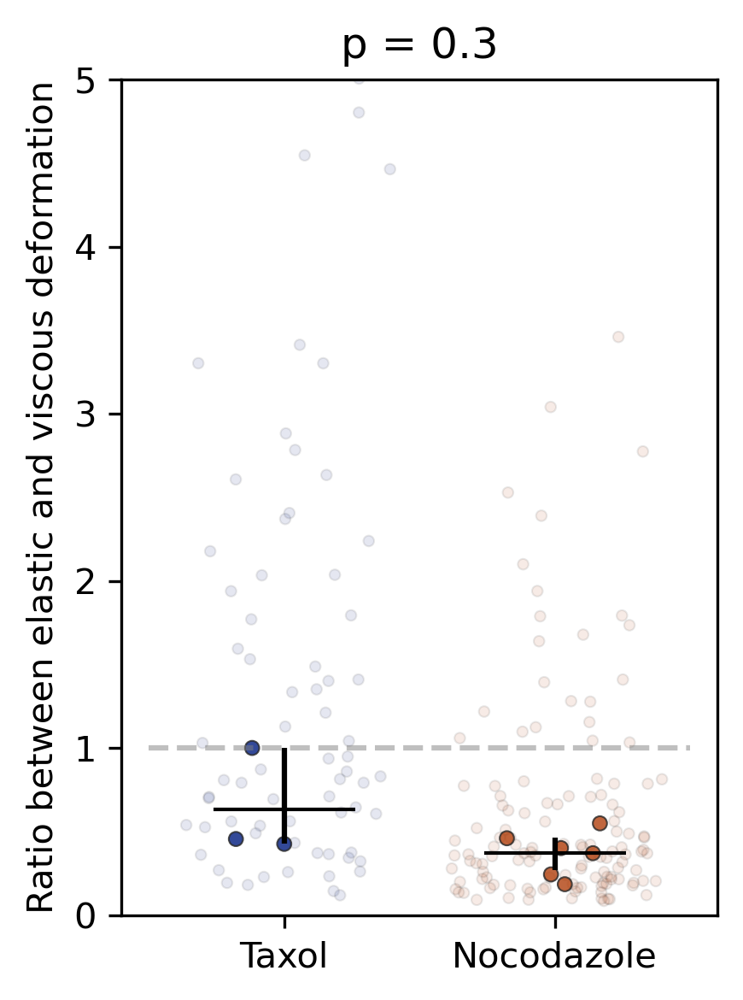

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_53945/2389244665.py:12: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('dark'), zorder=1)


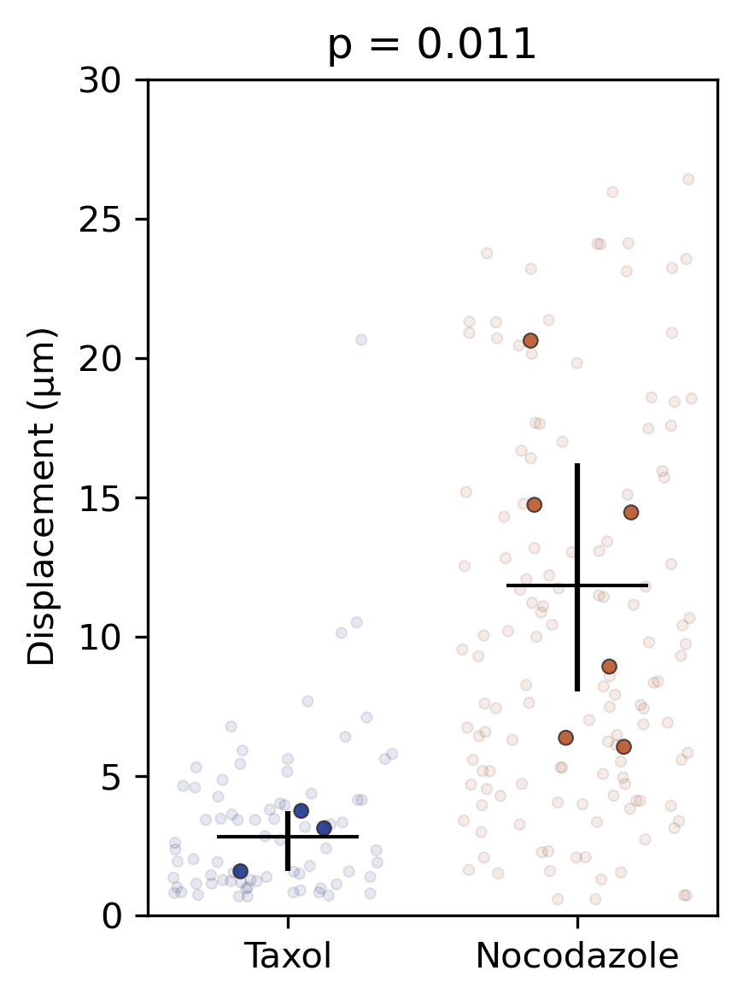

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_53945/2389244665.py:12: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('dark'), zorder=1)


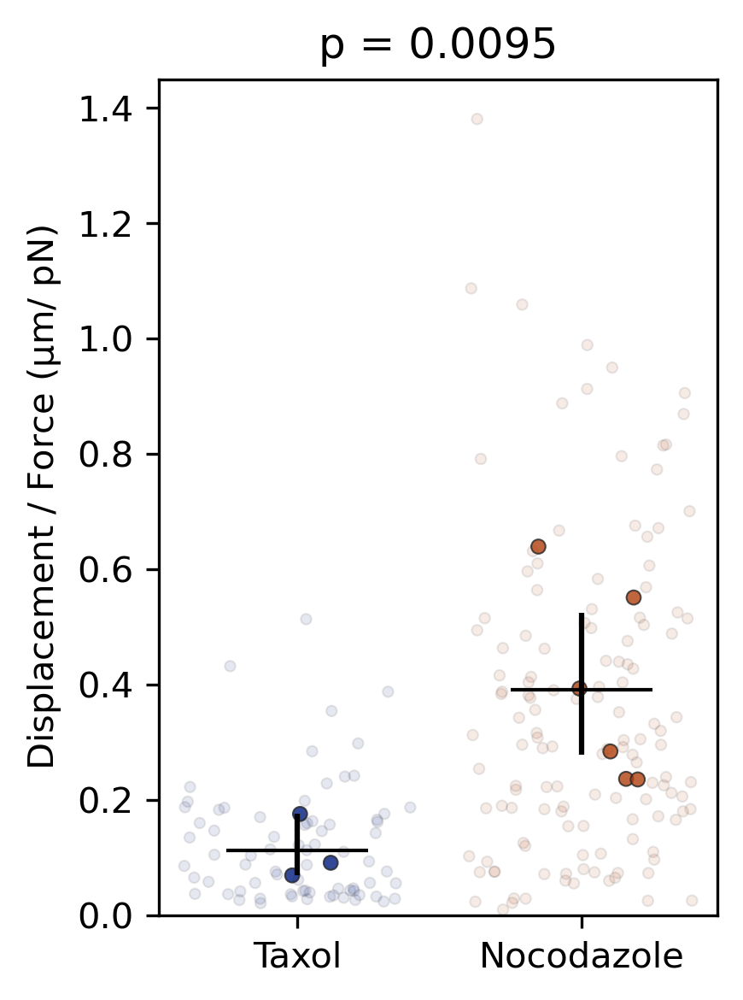

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_53945/2389244665.py:12: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('dark'), zorder=1)


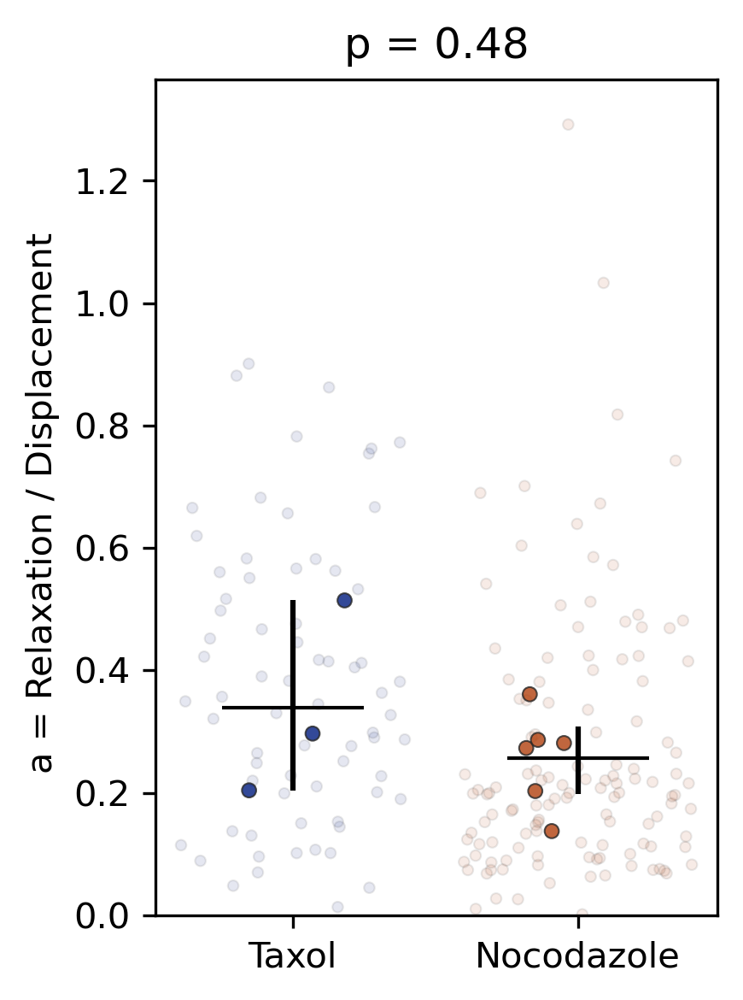

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_53945/2389244665.py:12: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('dark'), zorder=1)


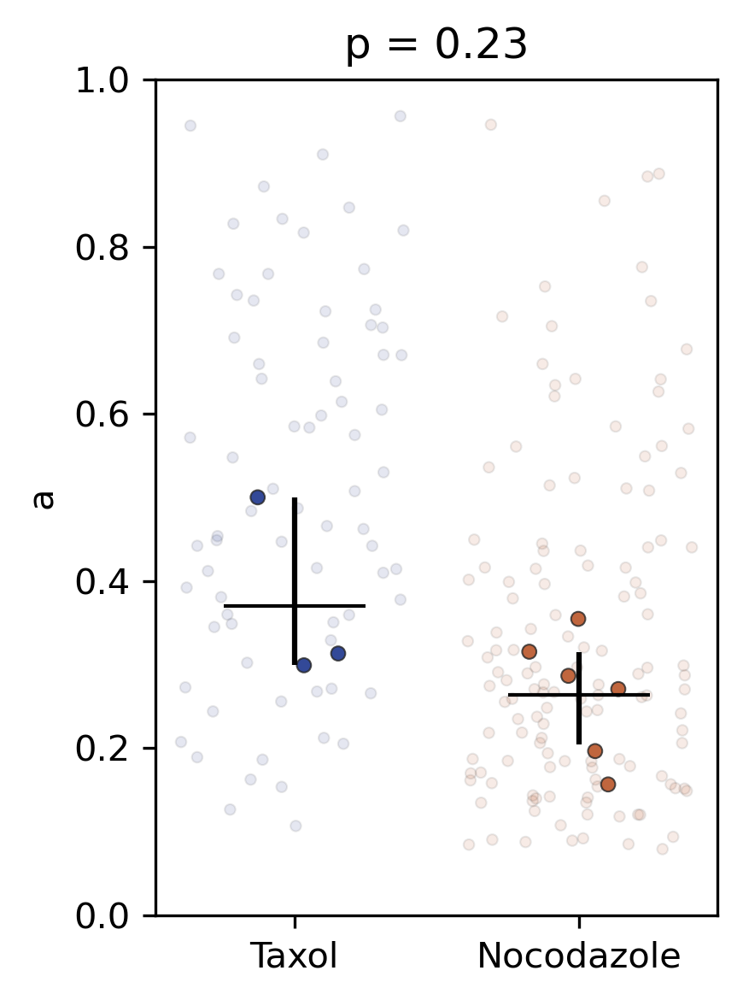

/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_53945/2389244665.py:12: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('dark'), zorder=1)


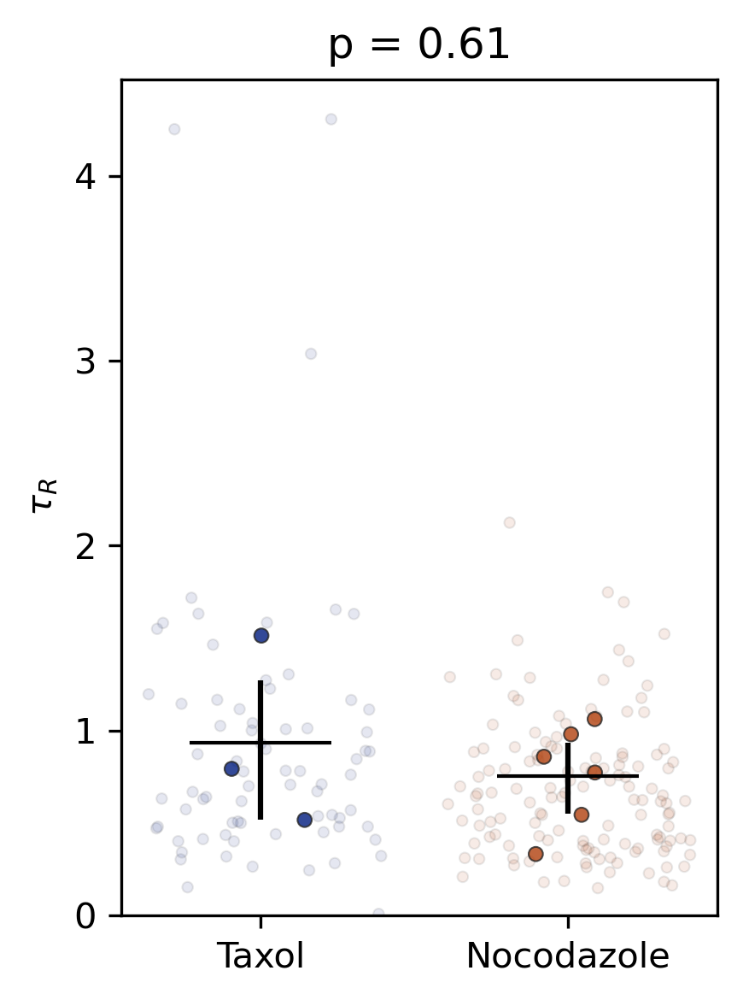

In [79]:
df_params_stats = df_params_stats.sort_values(by='MT_STATUS', ascending=False)
df_results_filtered = df_results_filtered.sort_values(by='MT_STATUS', ascending=False)

for (param, label) in zip(params, labels):
    p_value = p_values[param]
    fig = plt.figure(figsize=(3, 4), dpi=300)
    sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_filtered, jitter=0.4, alpha=0.1, linewidth=0.5, legend=False, size=3, zorder=0, palette=darker_colors)
    # sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_data_stats, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, zorder=1, palette=darker_colors)

    if param in df_results_from_average_curves.columns:
        p_value_avg_curves = p_values_avg_curves[param]
        sns.stripplot(x='MT_STATUS', y=param, hue='MT_STATUS', data=df_results_from_average_curves, jitter=0.2, alpha=0.8, linewidth=0.5, legend=False, size=4, palette=sns.color_palette('dark'), zorder=1)
        # plt.text(0.5, 1.05, f'p = {p_value_avg_curves:.2g}', ha='center', va='bottom', fontsize=10, color='gray')

        plt.errorbar(df_params_avg_curves_stats.loc[df_params_avg_curves_stats['parameter']==param, 'MT_STATUS'], 
                 df_params_avg_curves_stats.loc[df_params_avg_curves_stats['parameter']==param, 'weighted_average'], 
                 yerr=np.array([df_params_avg_curves_stats.loc[df_params_avg_curves_stats['parameter']==param, 'y_err_low'].values, df_params_avg_curves_stats.loc[df_params_avg_curves_stats['parameter']==param, 'y_err_high'].values]), 
                 marker = '_', markersize=40,  color='k', linestyle='', zorder=2)


    # plt.errorbar(df_params_stats.loc[df_params_stats['parameter']==param, 'MT_STATUS'], 
    #              df_params_stats.loc[df_params_stats['parameter']==param, 'weighted_average'], 
    #              yerr=np.array([df_params_stats.loc[df_params_stats['parameter']==param, 'y_err_low'].values, df_params_stats.loc[df_params_stats['parameter']==param, 'y_err_high'].values]), 
    #              marker = '_', markersize=40,  color='k', linestyle='', zorder=2)


    plt.title(f'p = {p_value_avg_curves:.2g}')
    plt.ylabel(label)
    plt.xlabel('')
    plt.ylim(bottom=0)
    plt.xticks(ticks = ['taxol', 'noco'], labels=['Taxol', 'Nocodazole'])
    if param == 'eta_2':
        plt.ylim(bottom=0, top=800)
    elif param == 'elastic_viscous_ratio':
        plt.ylim(bottom=0, top=5)
        plt.hlines(1, -0.5, 1.5, color='gray', linestyle='--', alpha=0.5)
    elif param == 'rising_dif':
        plt.ylim(bottom=0, top=30)
    # elif param == 'relative_dif':
    #     plt.ylim(bottom=0, top=1)

    # plt.yscale('log')
    plt.tight_layout()
    plt.savefig(f'{dir_plots}/results/result_{param}.svg', format='svg')
    plt.show()